<a href="https://colab.research.google.com/github/ramisetti/3SDLMooringPrediction/blob/main/Testing_4_LSTM_Epochs_50_Batch_8_CSIR.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import math
import time
import torch
import torchvision
import torch.nn as nn
import torchvision.datasets as dataset
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
import numpy as np
import torch.utils.data as dl
import torch.nn.functional as F
import netCDF4 as nc
from copy import deepcopy
from sklearn.preprocessing import MinMaxScaler
import pandas as pd

df = pd.read_csv("/content/drive/MyDrive/CSIR Data/Copy of 15MW_Semi_4.out", delimiter = '\t', skiprows = 5)
df.drop(0, inplace = True)
df = df.astype('float64')

col = ["PtfmSurge","PtfmSway","PtfmHeave","PtfmRoll","PtfmPitch","PtfmYaw","FAIRTEN1","FAIRTEN2","FAIRTEN3"]
X = df.loc[:,["PtfmSurge","PtfmSway","PtfmHeave","PtfmRoll","PtfmPitch","PtfmYaw","FAIRTEN1","FAIRTEN2","FAIRTEN3"]]
y = df.loc[:,["FAIRTEN1","FAIRTEN2","FAIRTEN3"]]


class TOtensor:
    def __call__(self, sample):
        inputs, targets = sample
        inputs = inputs.to_numpy()
        targets = targets.to_numpy()
        return torch.from_numpy(inputs).to(torch.float32), torch.from_numpy(targets).to(torch.float32)

class ABCD(Dataset):
    def __init__(self,data,transform = None):
        self.data = data
        self.n_samples = data.shape[0]-10
        self.x_data = data
        self.y_data = data
        self.transform = transform

    def __getitem__(self, index):
        # print(type(index))
        self.index = int(index)
        sample= self.x_data.loc[index:index+4,:], self.y_data.loc[index+5,"FAIRTEN1":"FAIRTEN3"]
        if self.transform:
            sample = self.transform(sample)
        return sample

    def __len__(self):
        return self.n_samples


from sklearn.preprocessing import MinMaxScaler








std_scaler = MinMaxScaler(feature_range=(-1, 1))
X_unscaled = X.loc[2001:30000,:]

X_scaled = std_scaler.fit_transform(X_unscaled)
X_scaled = pd.DataFrame(X_scaled, columns=col)
X_scaled = X_scaled.astype('float64')
final_df = ABCD(X_scaled, transform= TOtensor())

train_loader = DataLoader(dataset=final_df,
                          batch_size=8,
                          shuffle=False,
                          num_workers= 0)



temp = X.iloc[30001:40000,:].reset_index()
temp = temp.drop(temp.columns[0],axis = 1)
y_scaled = std_scaler.transform(temp)
y_scaled = pd.DataFrame(y_scaled, columns=col)
y_scaled = y_scaled.astype('float64')
final_df_test = ABCD(y_scaled, transform= TOtensor())

# first_data = final_df[-1]
# features, labels = first_data
# print(features)
# print("Labels")
# print(labels)
# print(features.shape, labels.shape)
# print(final_df.n_samples)

test_loader = DataLoader(dataset=final_df_test,
                          batch_size=8,
                          shuffle=False,
                          num_workers= 0)
# data_iter = iter(test_loader)
# next_data = data_iter.next()
# features1, labels1 = next_data
# print(features1.shape, labels1.shape)
# print(features1, labels1)

/usr/local/lib/python3.8/dist-packages/IPython/core/interactiveshell.py:3326: DtypeWarning: Columns (0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


# Test

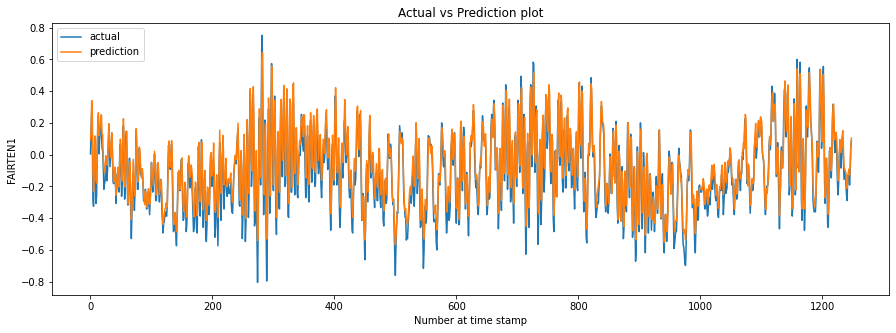

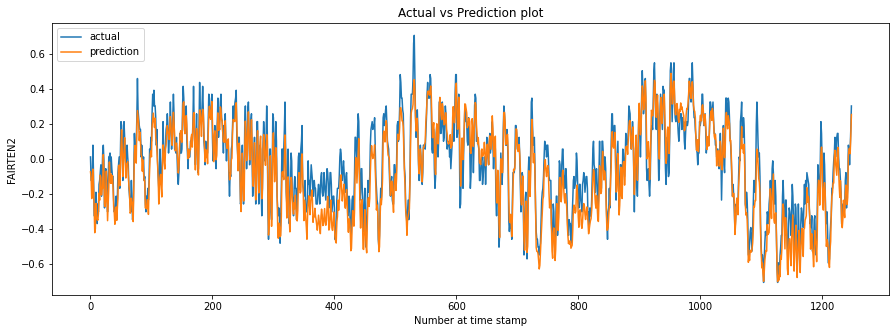

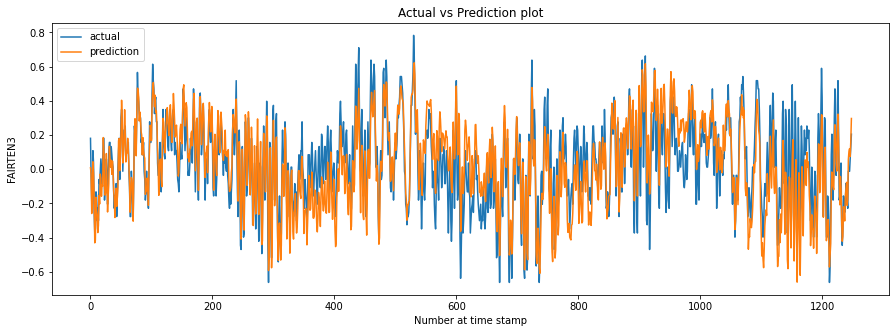

Epoch 1, Training loss 0.00274, Testing Loss 0.00162, Total time in Secs31


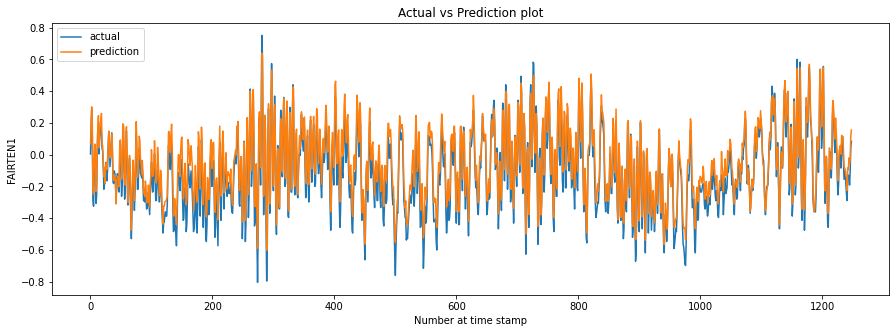

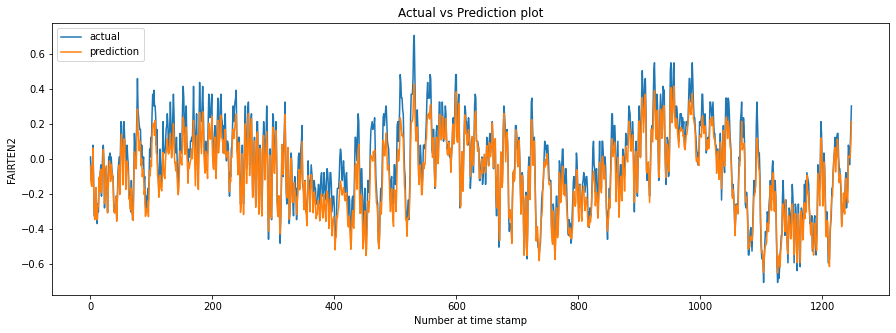

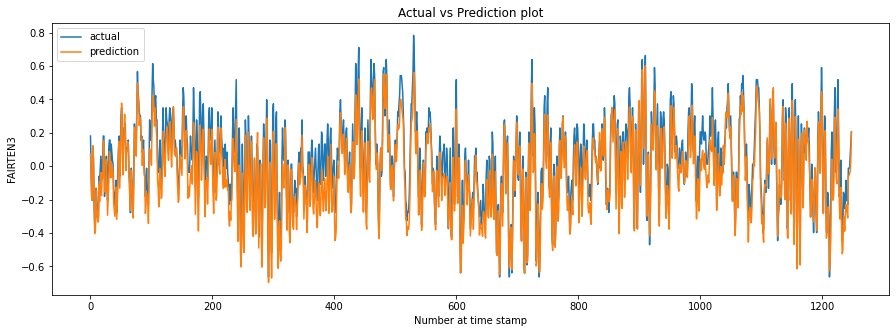

Epoch 2, Training loss 0.00060, Testing Loss 0.00077, Total time in Secs31


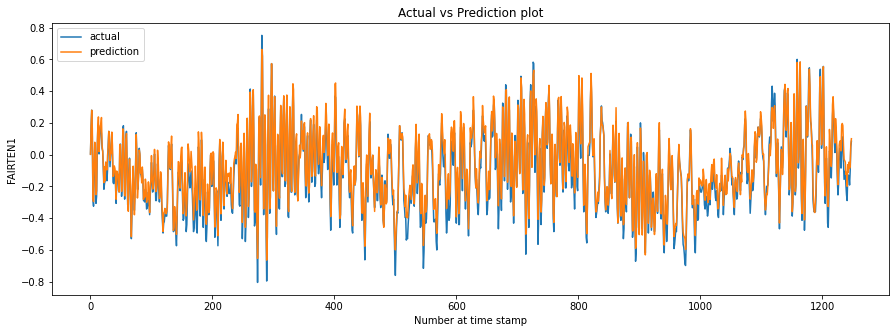

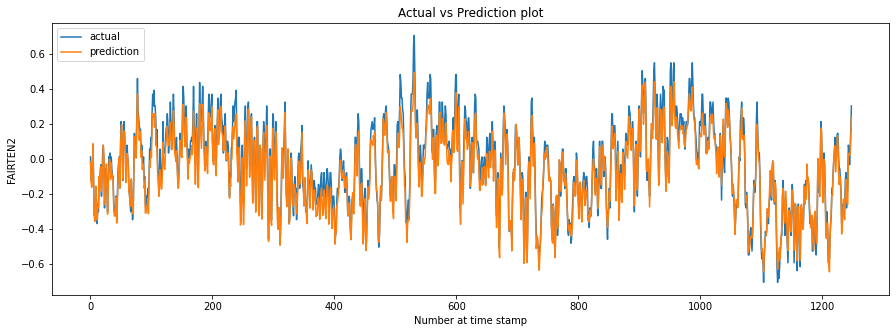

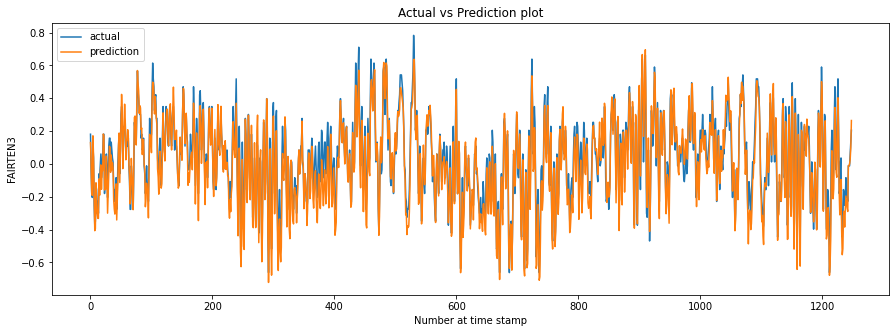

Epoch 3, Training loss 0.00039, Testing Loss 0.00049, Total time in Secs31


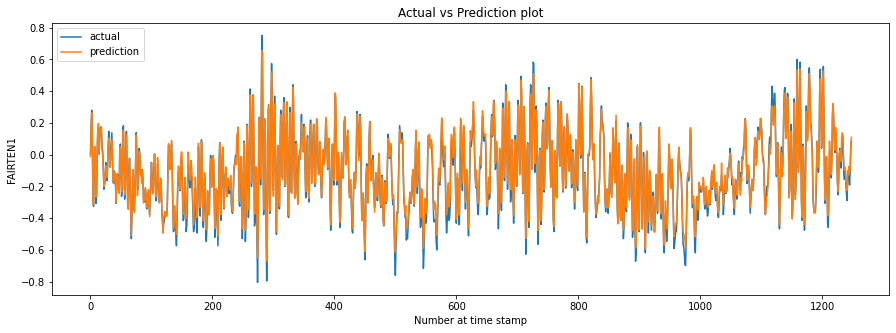

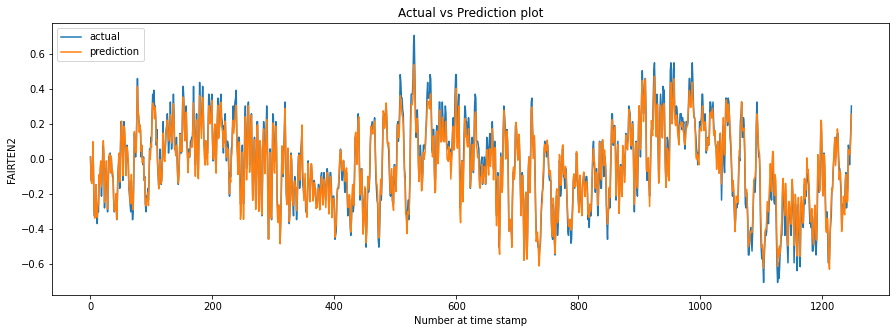

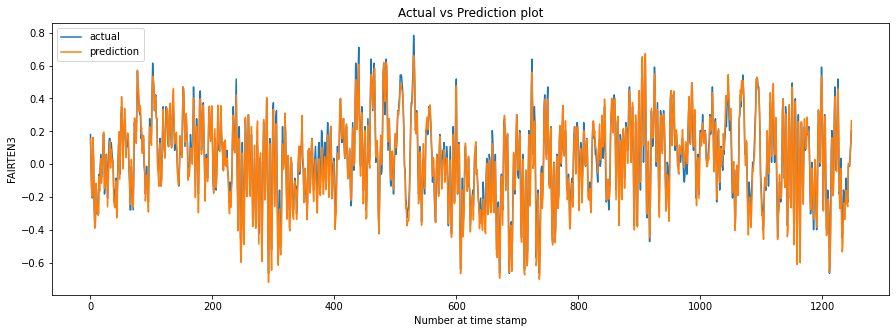

Epoch 4, Training loss 0.00030, Testing Loss 0.00027, Total time in Secs31


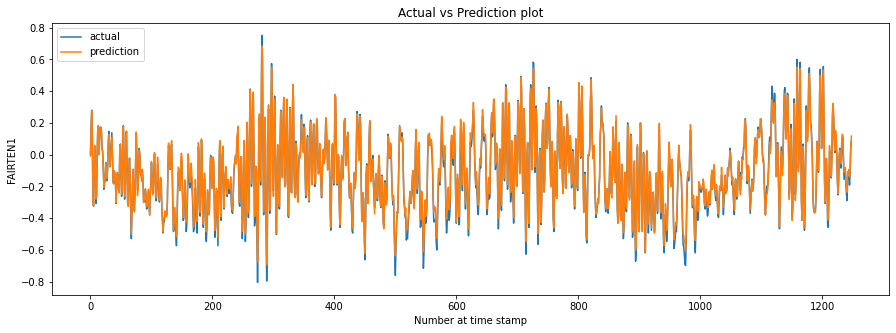

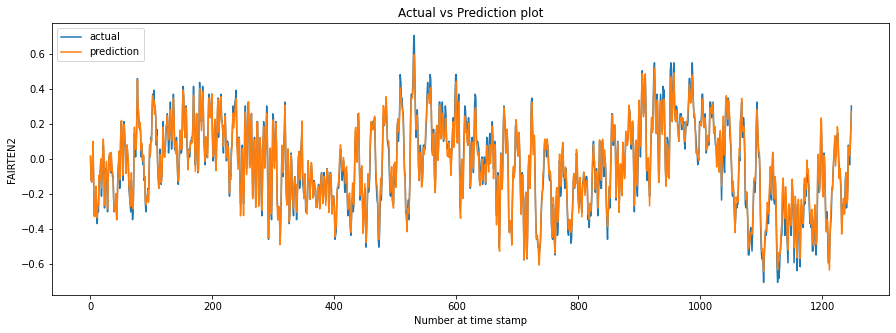

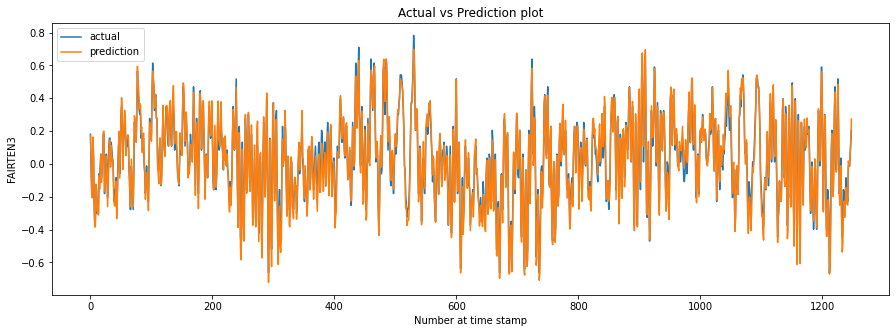

Epoch 5, Training loss 0.00020, Testing Loss 0.00020, Total time in Secs30


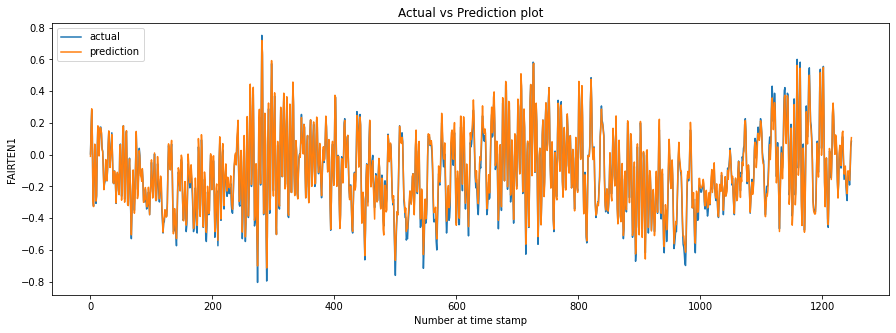

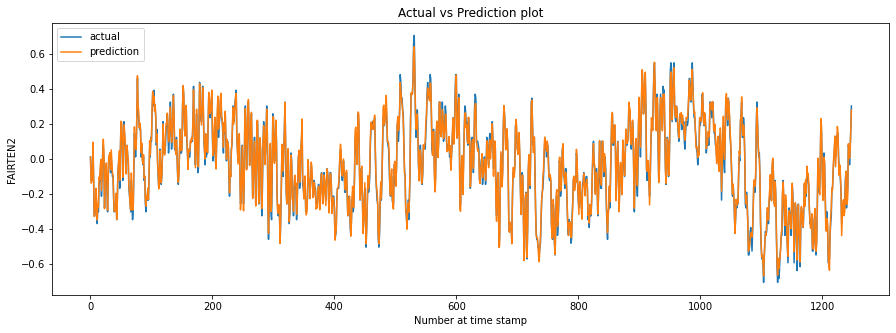

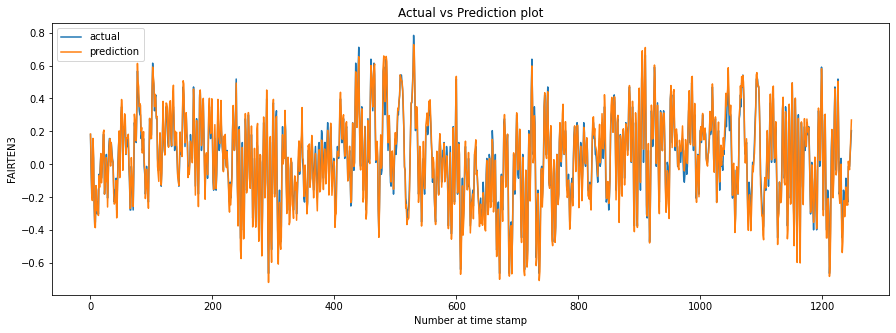

Epoch 6, Training loss 0.00015, Testing Loss 0.00016, Total time in Secs31


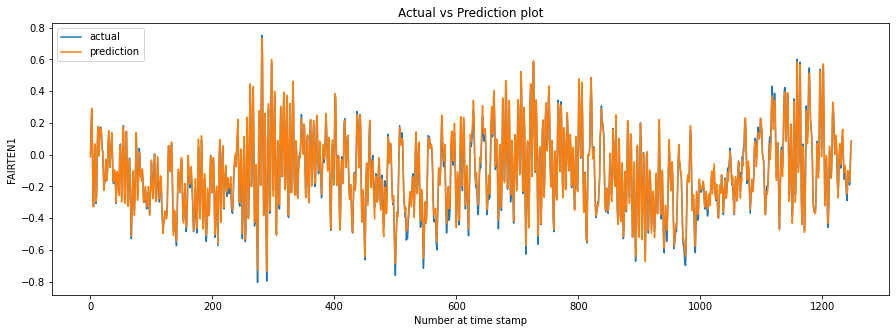

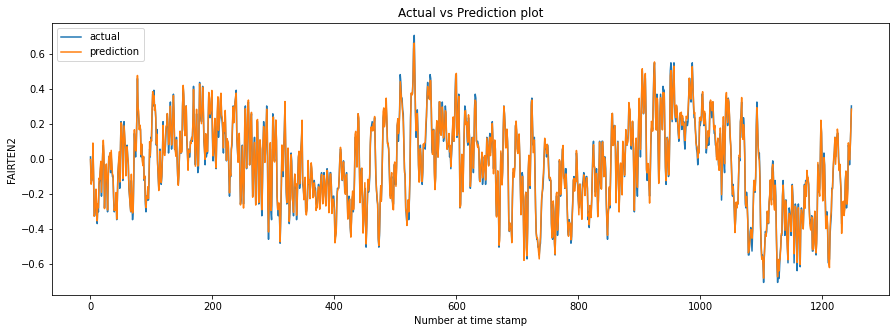

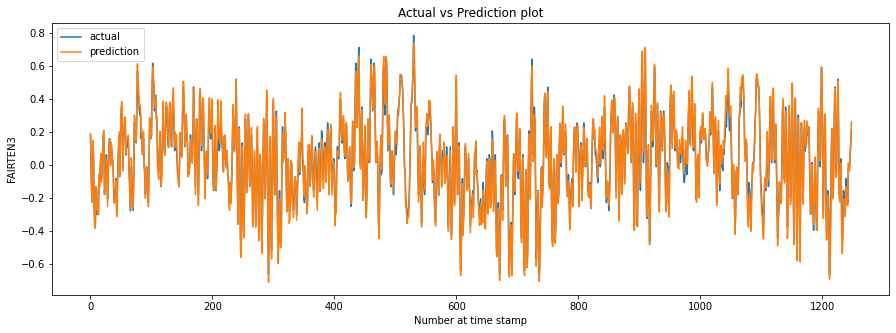

Epoch 7, Training loss 0.00011, Testing Loss 0.00013, Total time in Secs30


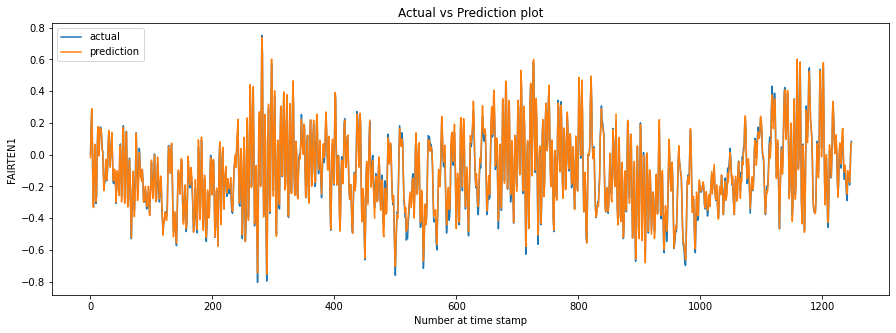

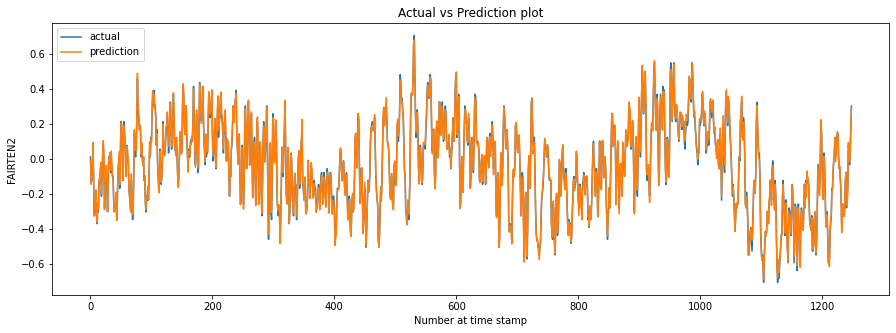

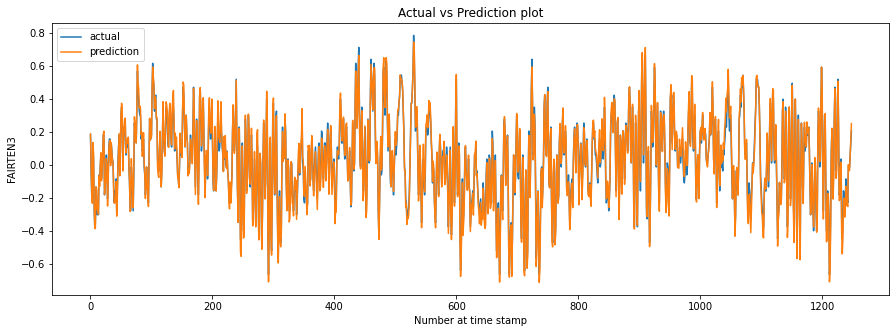

Epoch 8, Training loss 0.00009, Testing Loss 0.00011, Total time in Secs30


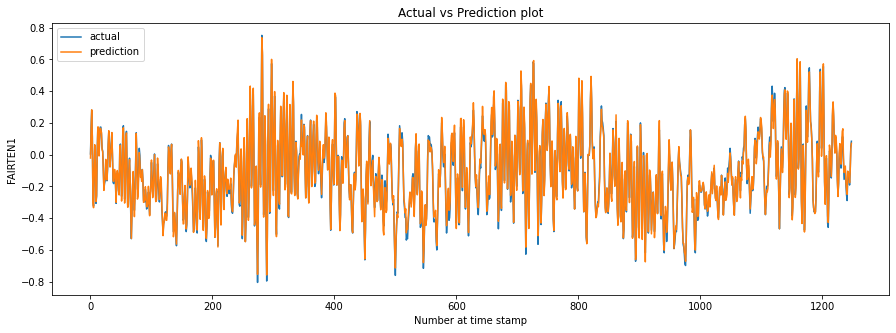

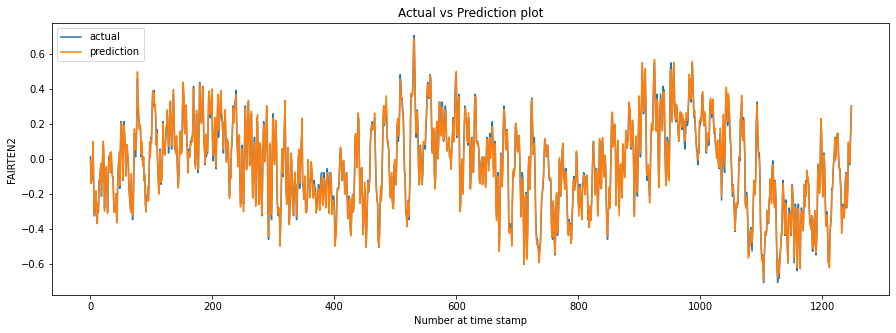

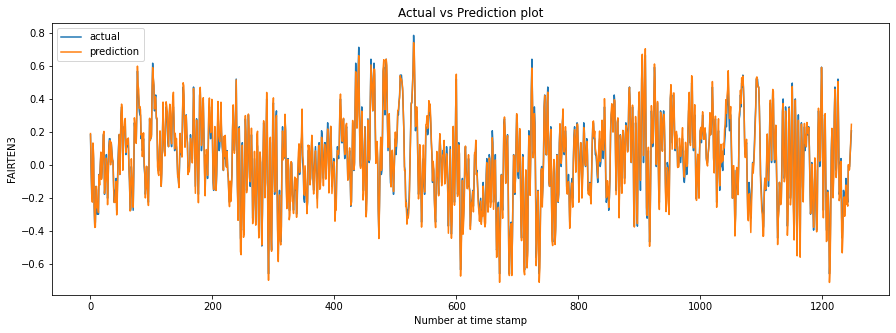

Epoch 9, Training loss 0.00008, Testing Loss 0.00010, Total time in Secs30


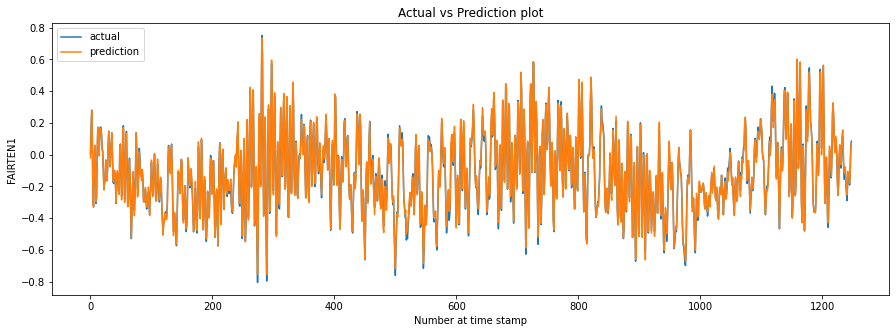

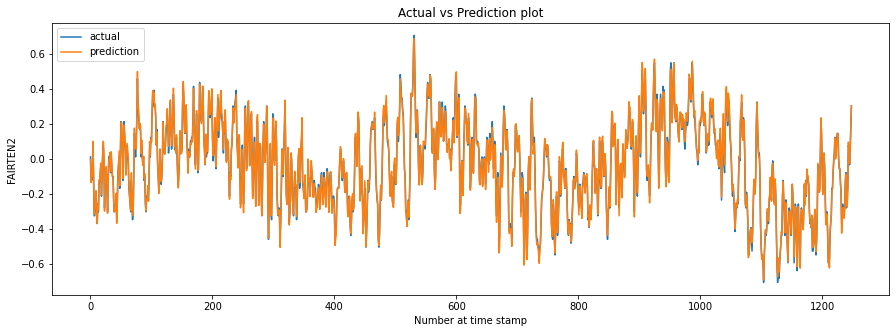

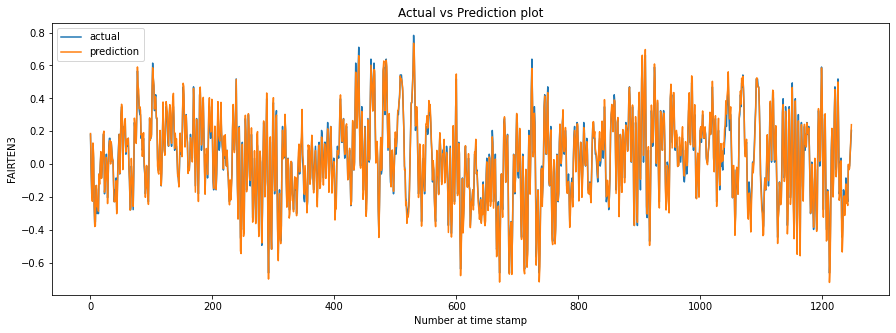

Epoch 10, Training loss 0.00007, Testing Loss 0.00009, Total time in Secs30


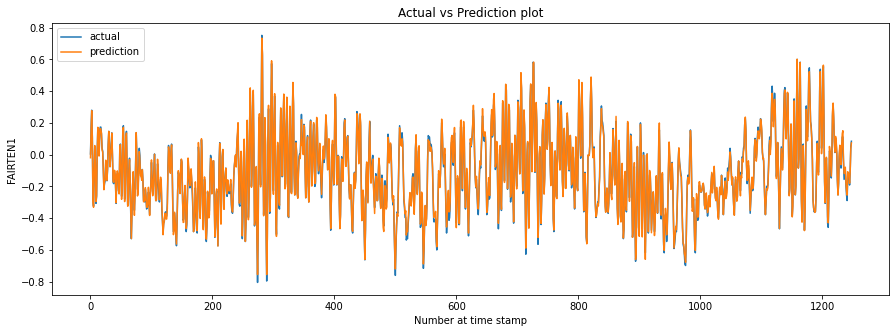

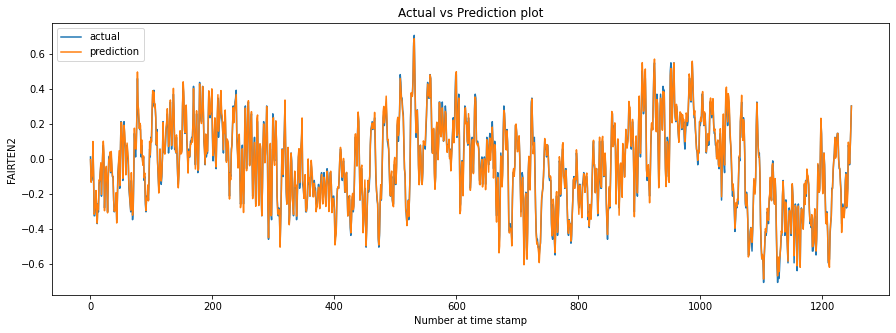

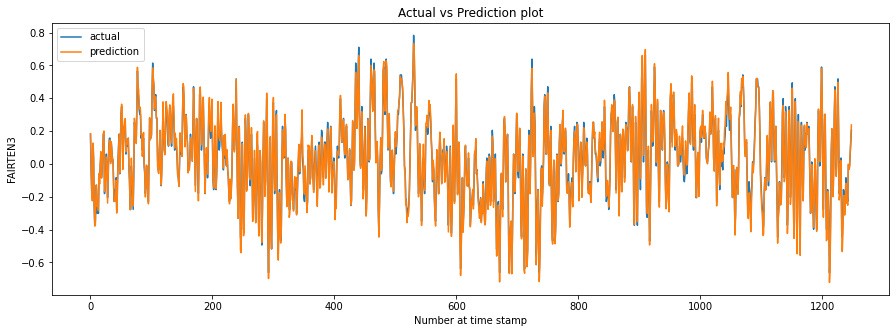

Epoch 11, Training loss 0.00007, Testing Loss 0.00008, Total time in Secs30


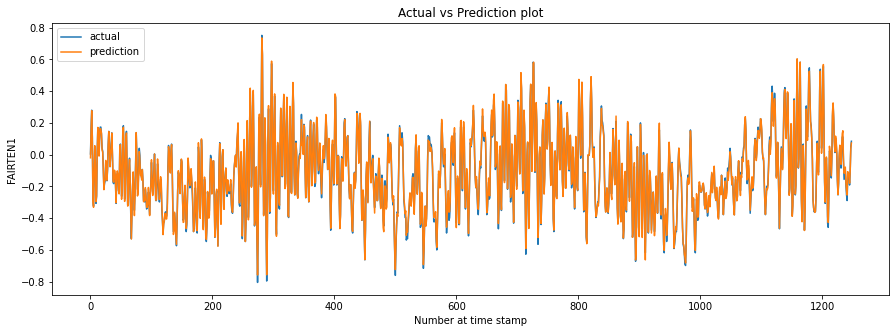

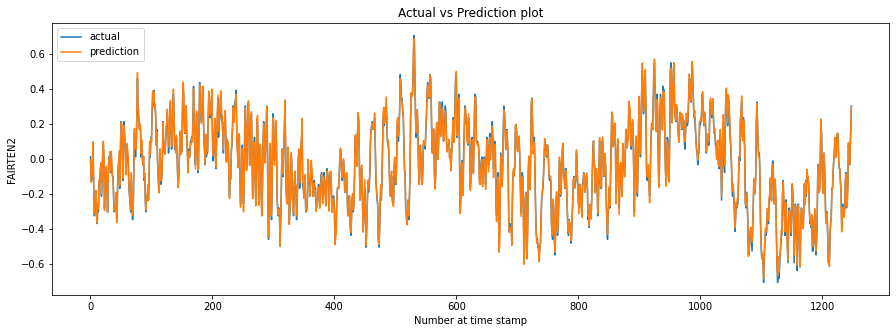

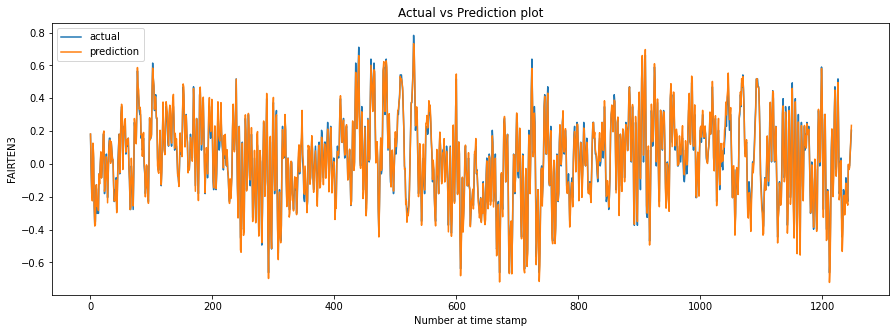

Epoch 12, Training loss 0.00006, Testing Loss 0.00008, Total time in Secs30


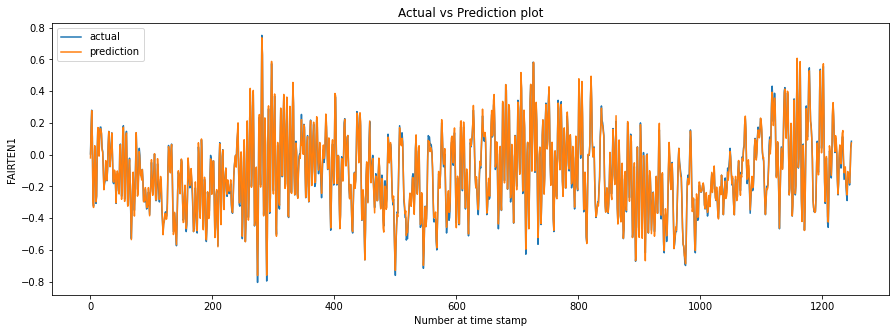

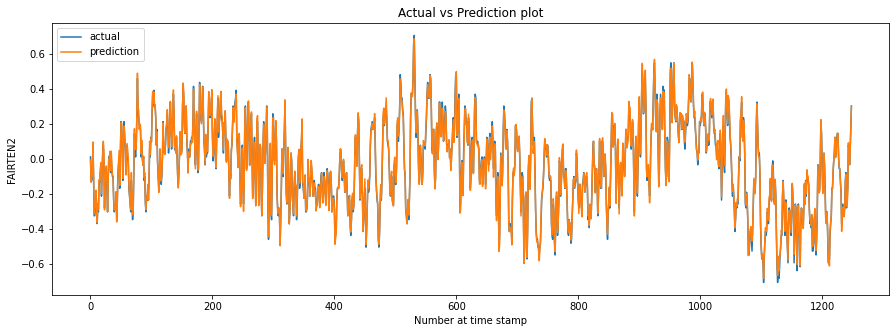

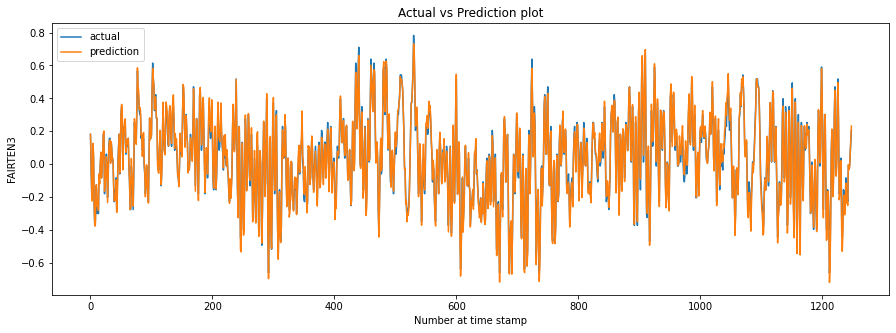

Epoch 13, Training loss 0.00006, Testing Loss 0.00008, Total time in Secs30


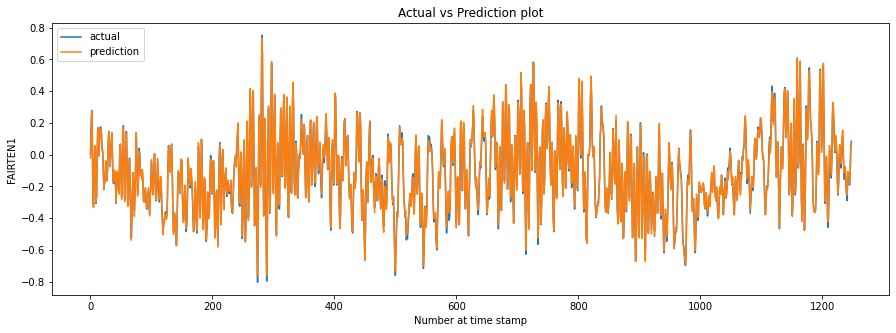

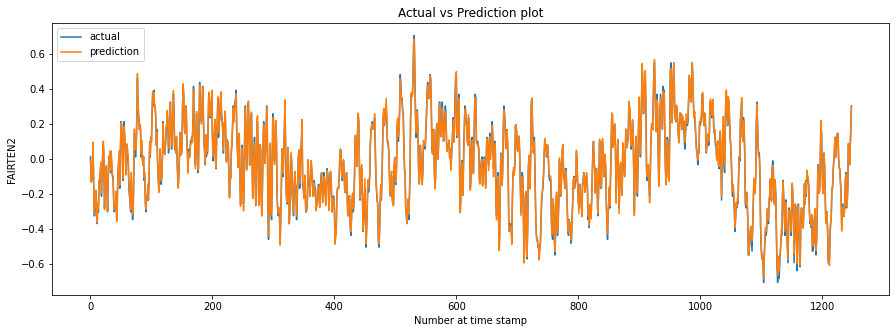

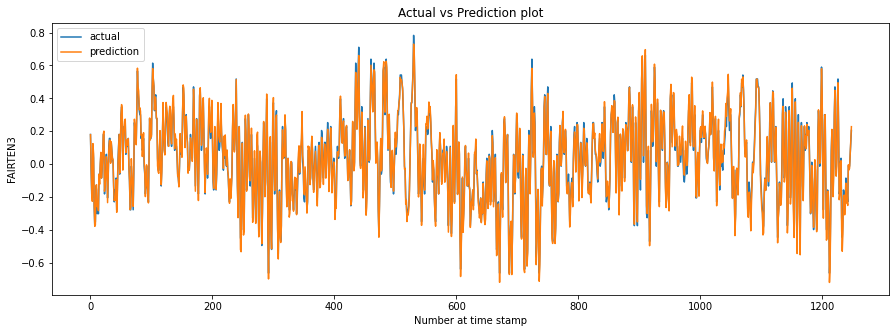

Epoch 14, Training loss 0.00006, Testing Loss 0.00007, Total time in Secs31


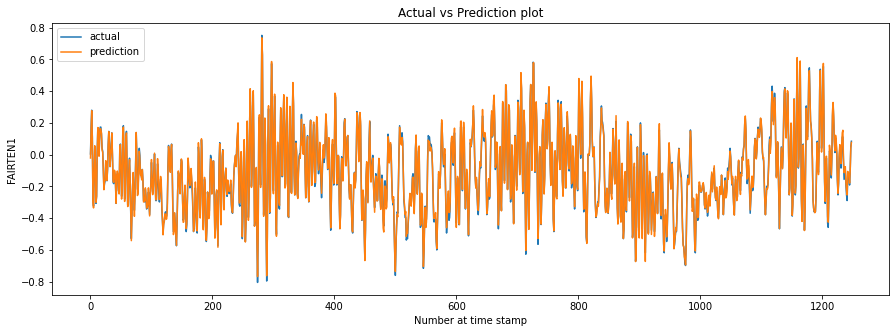

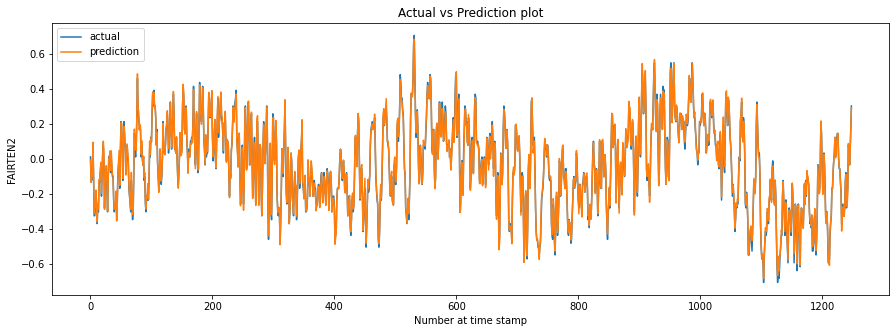

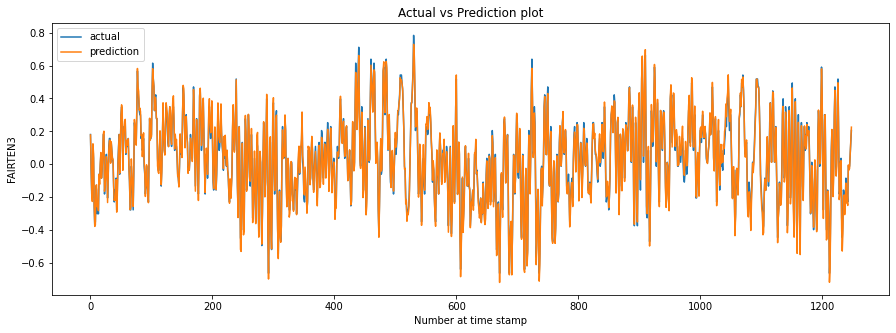

Epoch 15, Training loss 0.00006, Testing Loss 0.00007, Total time in Secs30


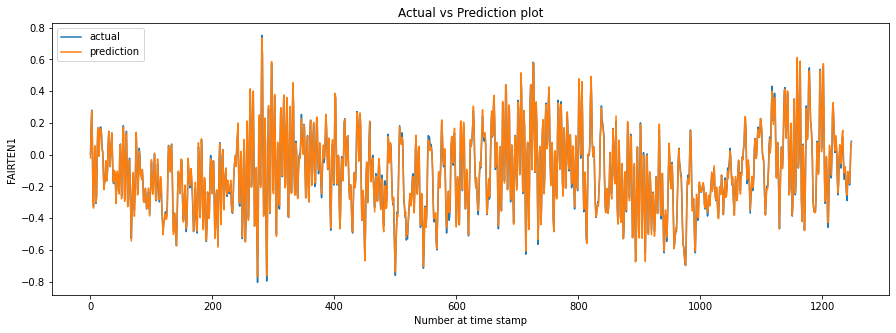

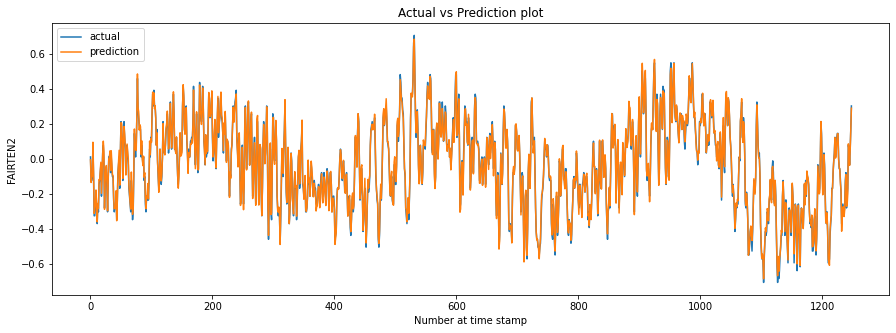

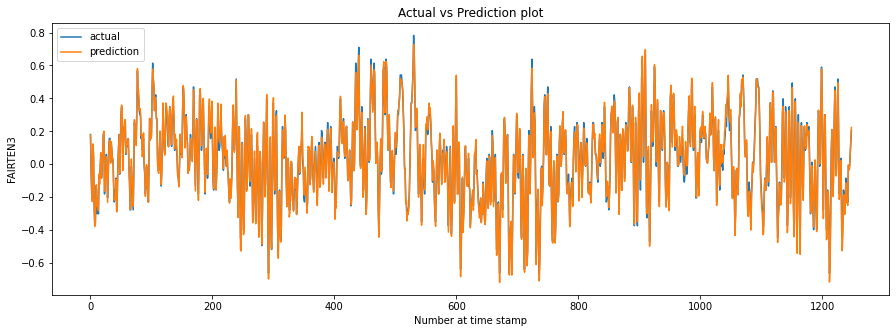

Epoch 16, Training loss 0.00006, Testing Loss 0.00007, Total time in Secs30


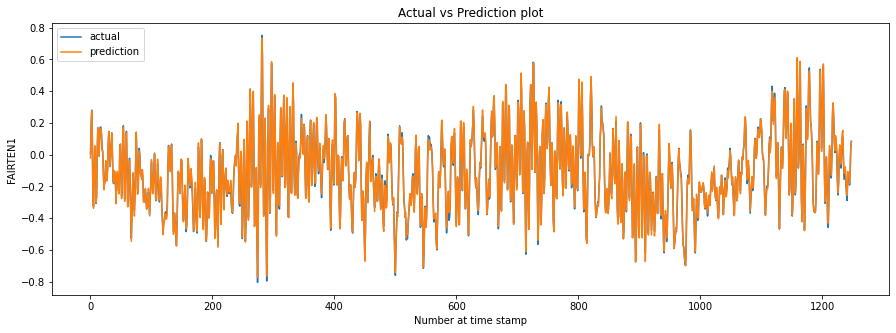

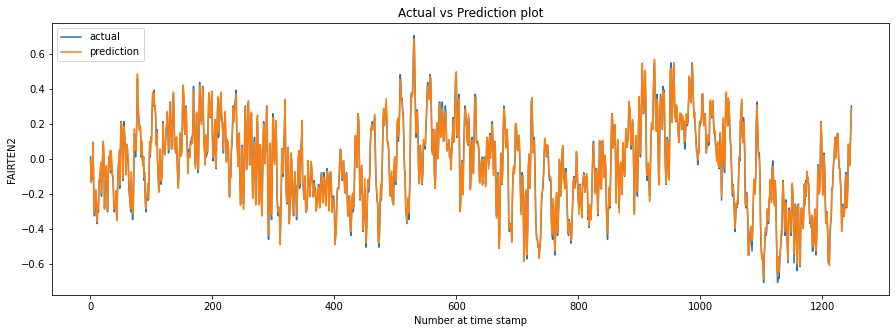

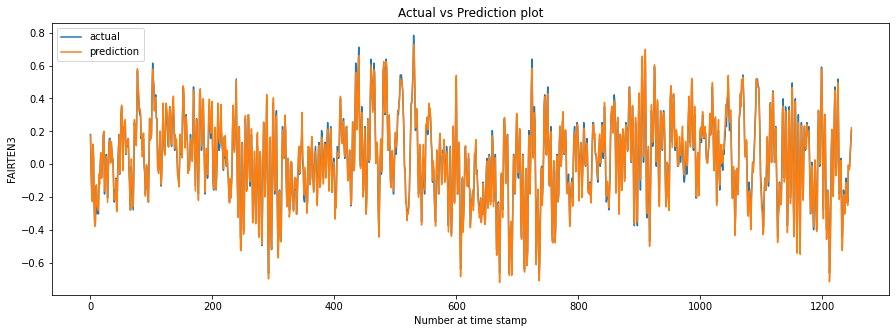

Epoch 17, Training loss 0.00006, Testing Loss 0.00007, Total time in Secs30


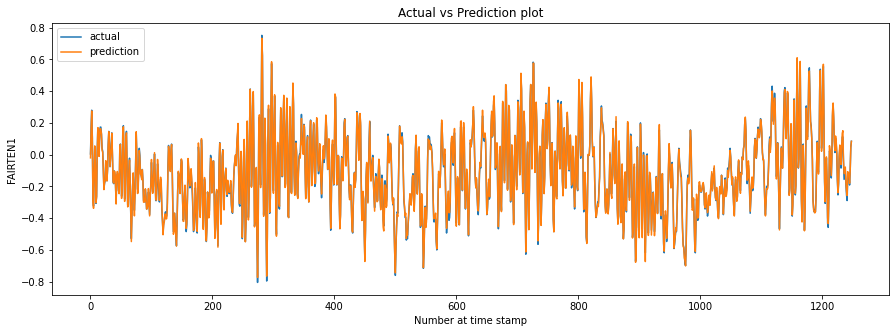

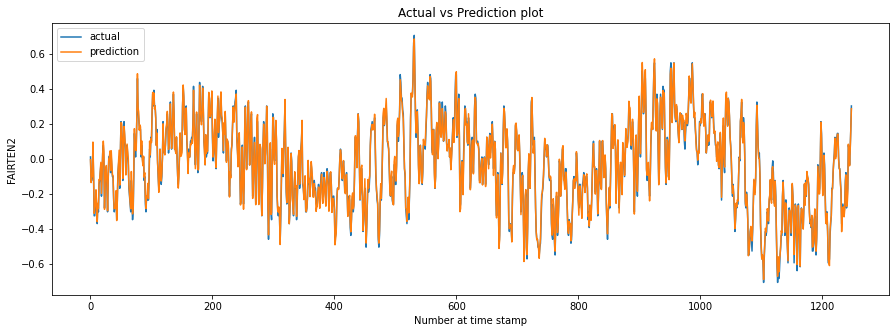

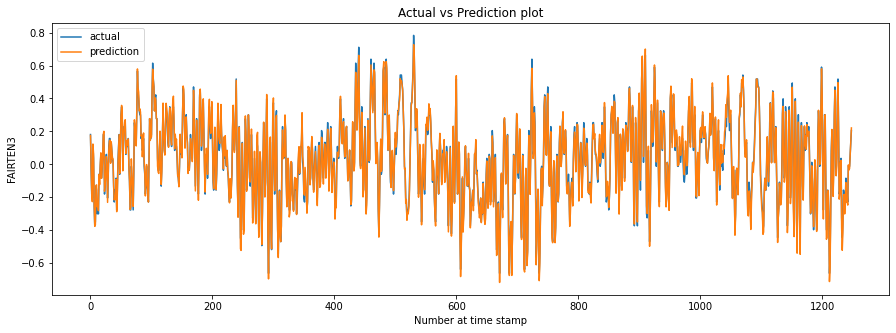

Epoch 18, Training loss 0.00006, Testing Loss 0.00006, Total time in Secs30


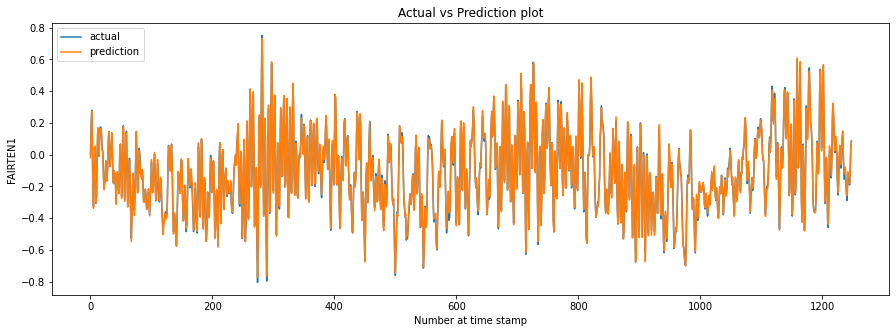

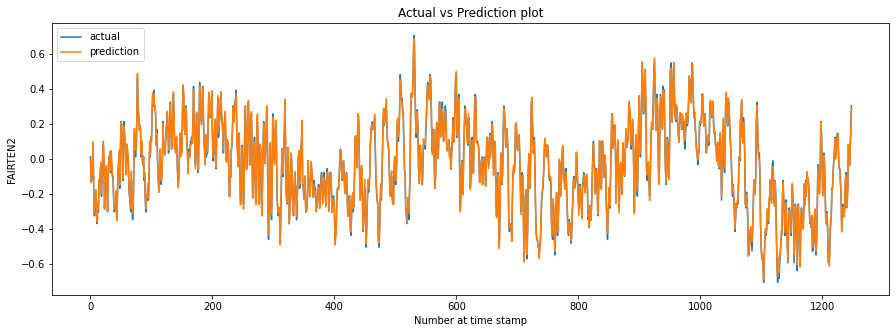

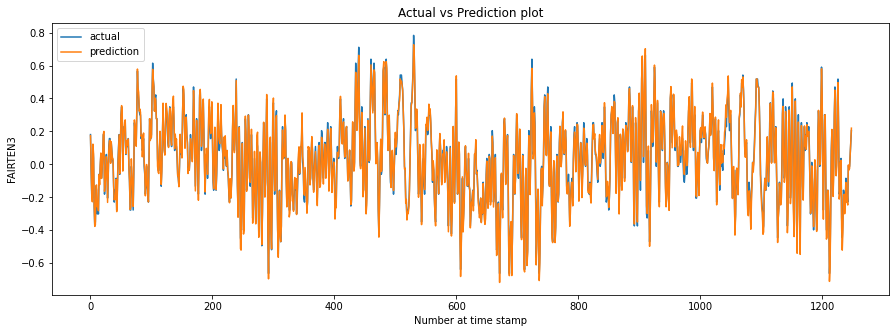

Epoch 19, Training loss 0.00006, Testing Loss 0.00006, Total time in Secs30


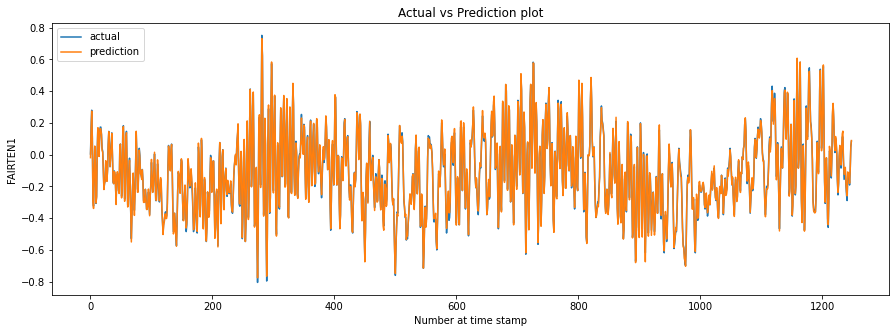

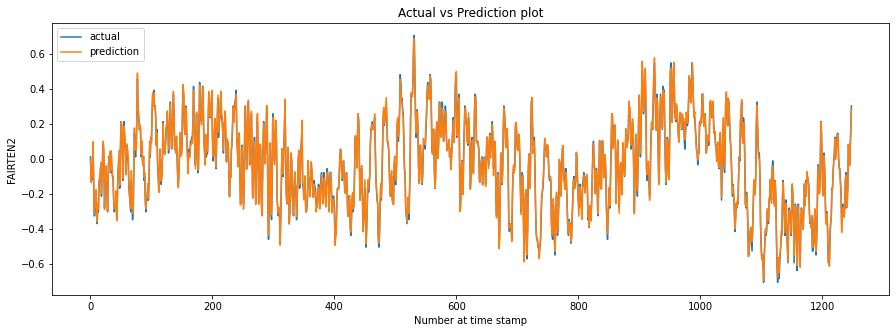

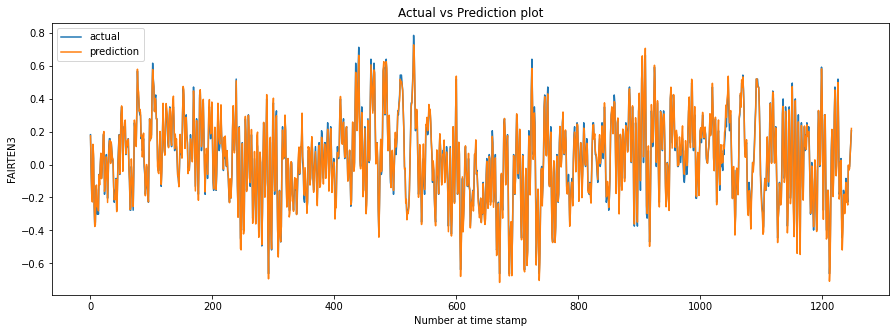

Epoch 20, Training loss 0.00006, Testing Loss 0.00006, Total time in Secs30


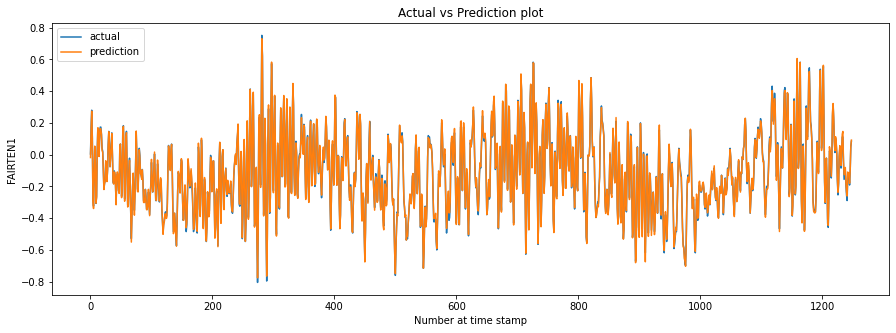

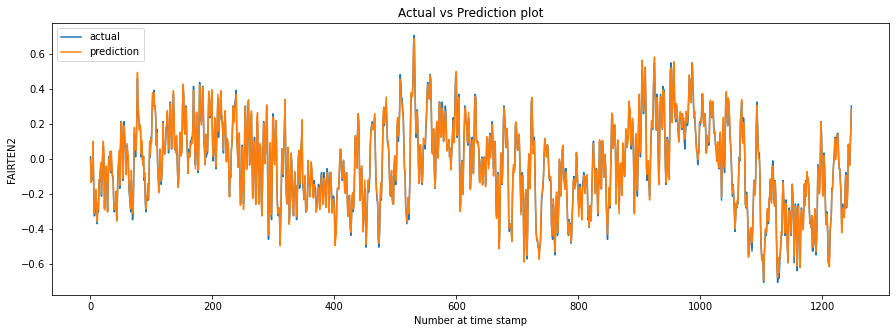

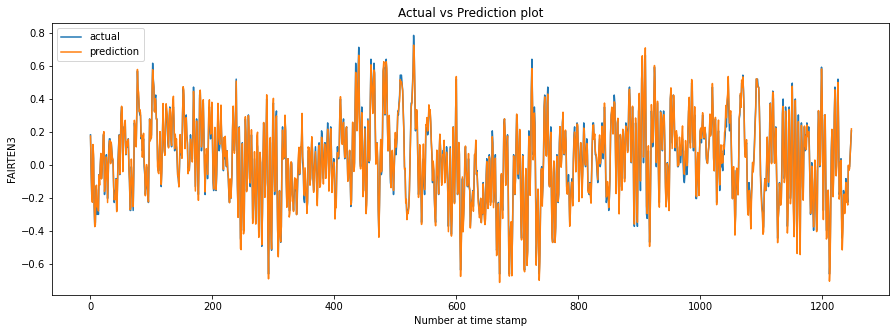

Epoch 21, Training loss 0.00006, Testing Loss 0.00006, Total time in Secs31


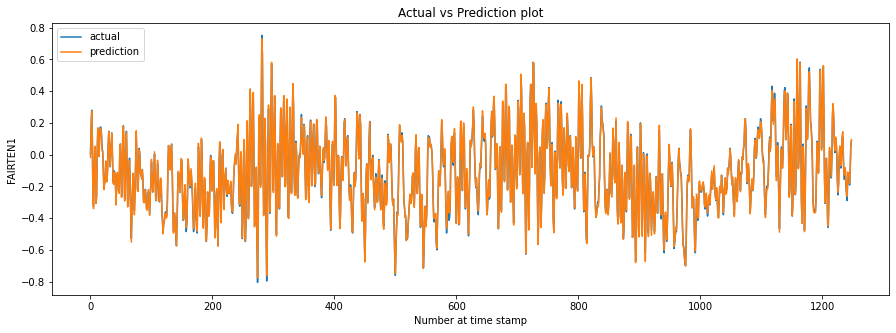

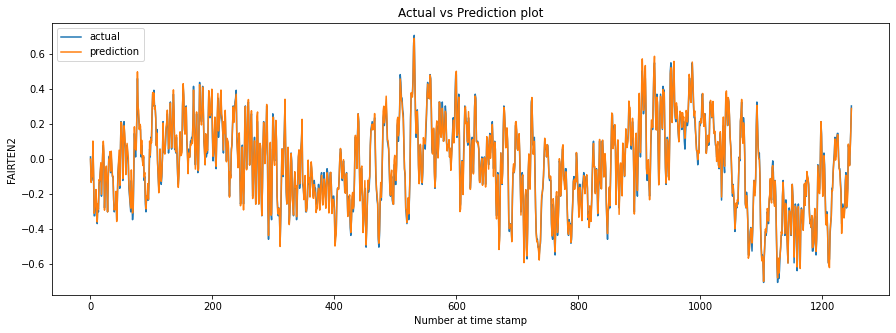

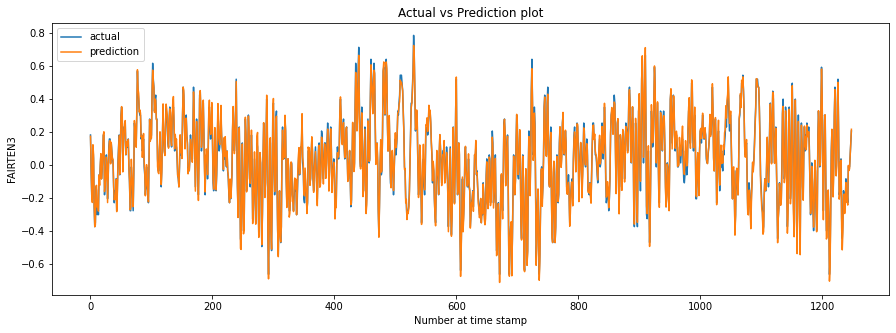

Epoch 22, Training loss 0.00006, Testing Loss 0.00006, Total time in Secs30


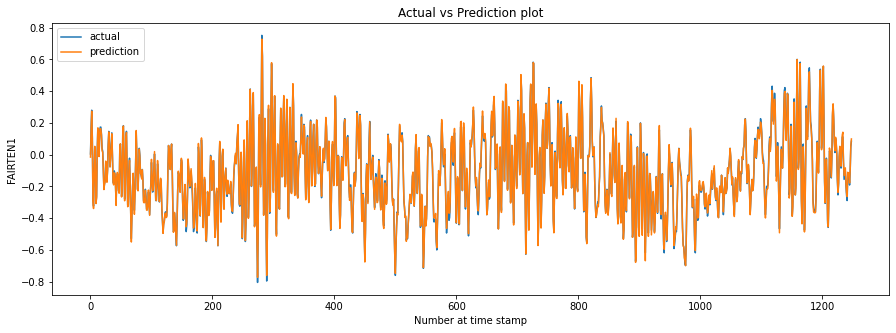

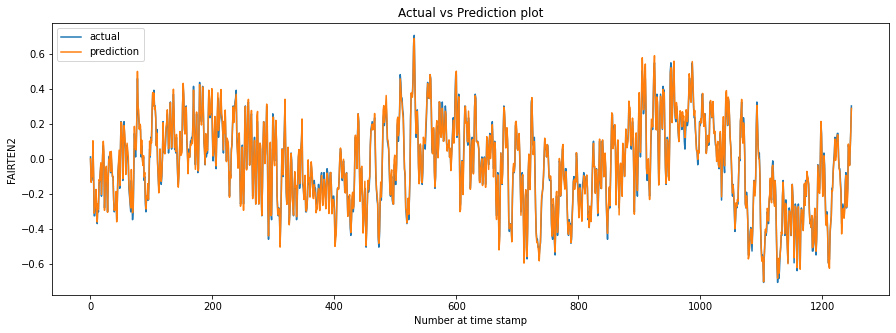

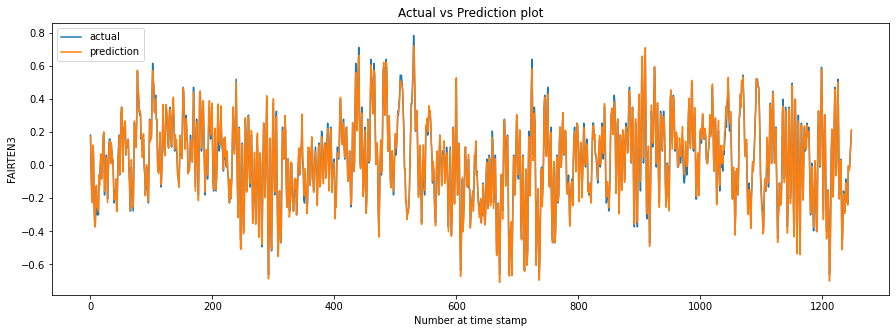

Epoch 23, Training loss 0.00006, Testing Loss 0.00006, Total time in Secs30


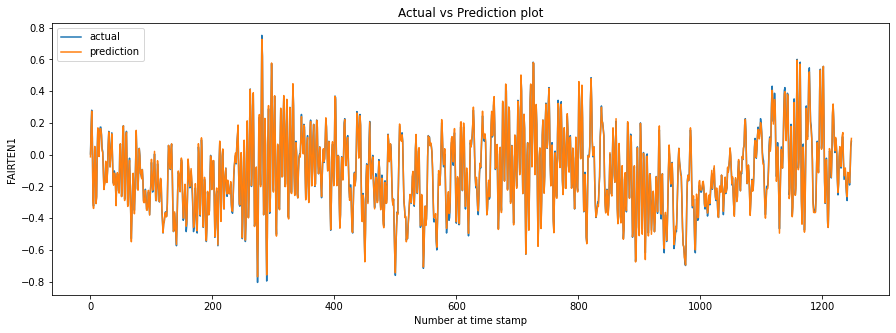

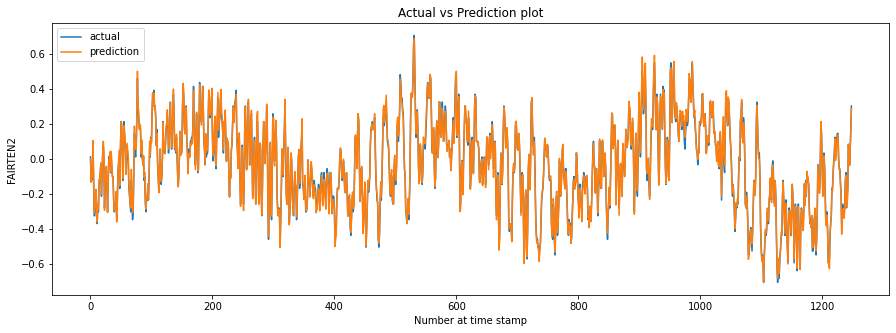

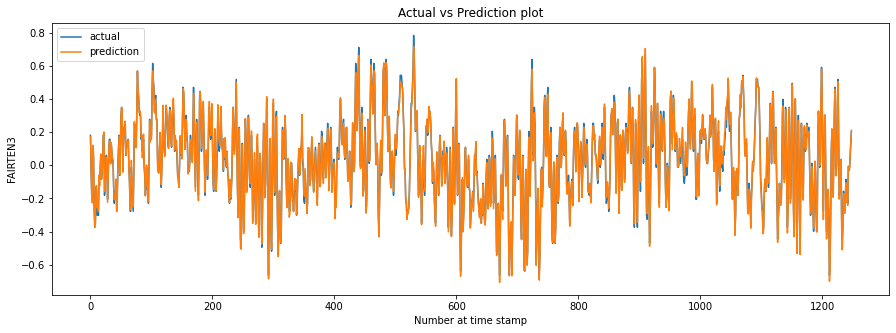

Epoch 24, Training loss 0.00006, Testing Loss 0.00006, Total time in Secs30


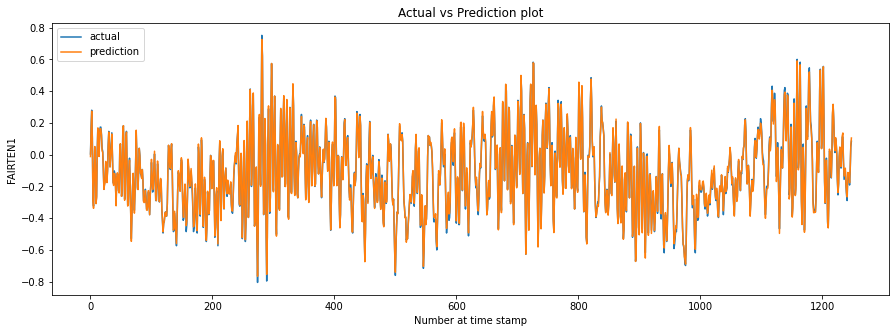

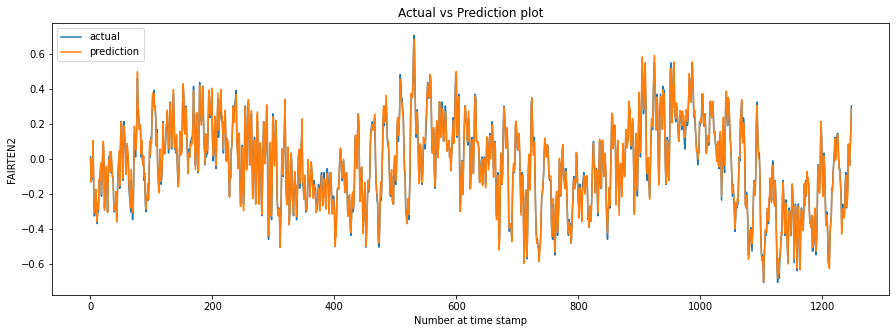

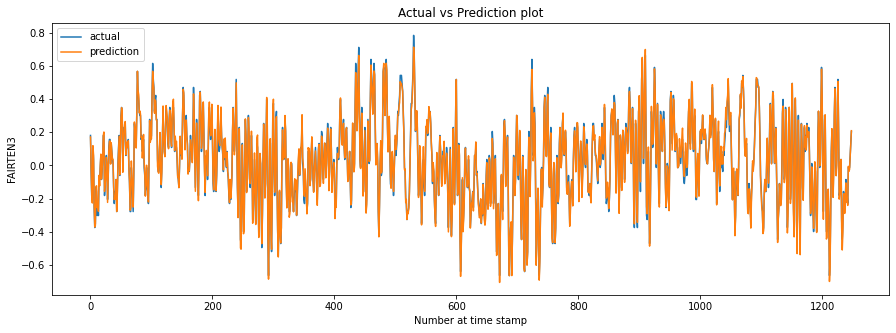

Epoch 25, Training loss 0.00006, Testing Loss 0.00006, Total time in Secs30


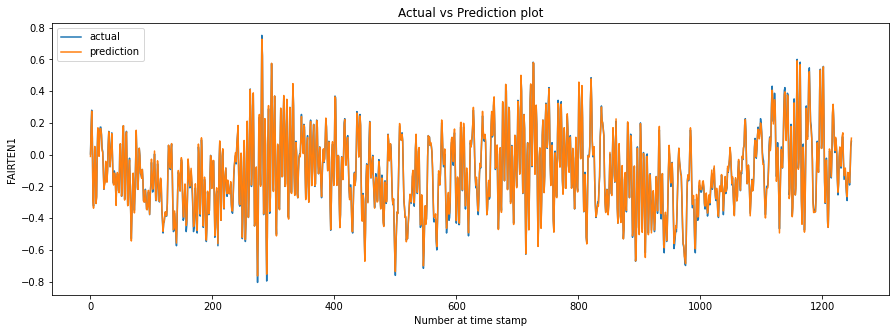

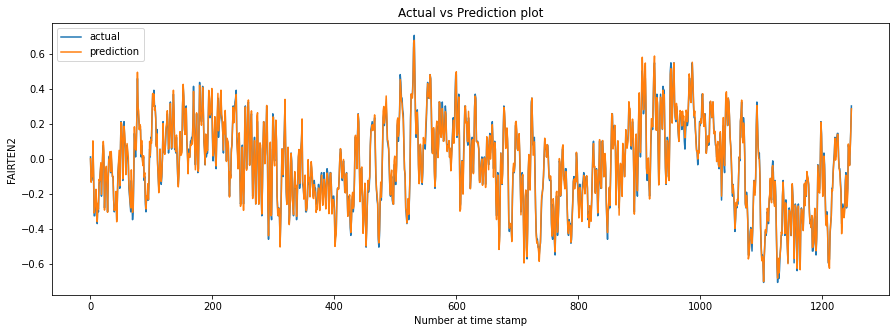

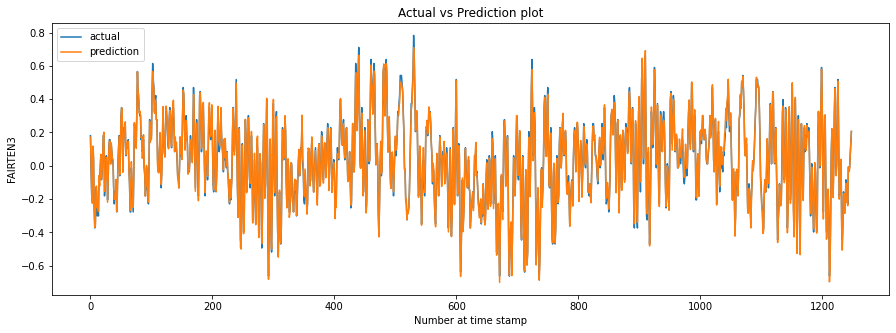

Epoch 26, Training loss 0.00006, Testing Loss 0.00006, Total time in Secs30


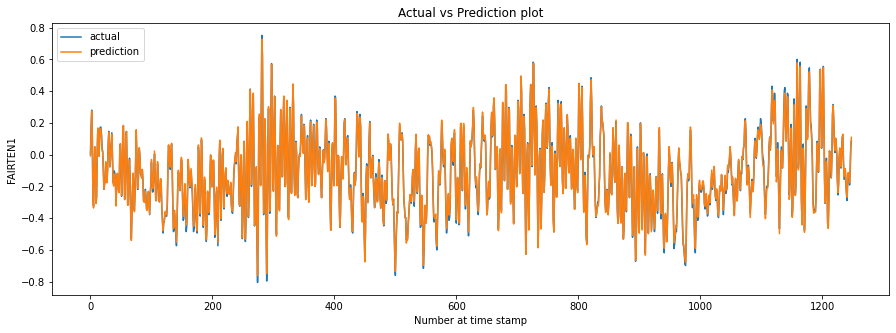

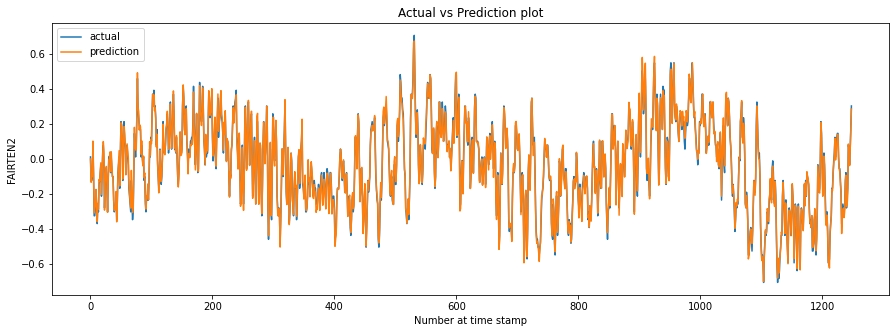

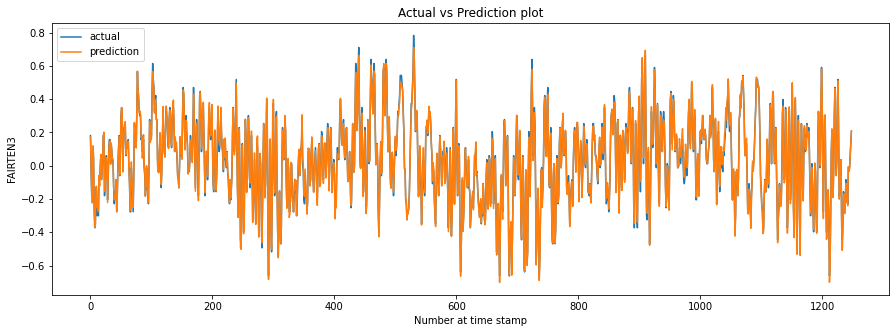

Epoch 27, Training loss 0.00006, Testing Loss 0.00006, Total time in Secs30


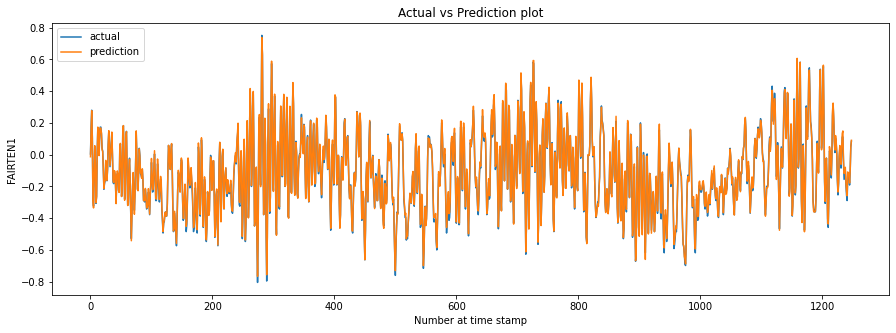

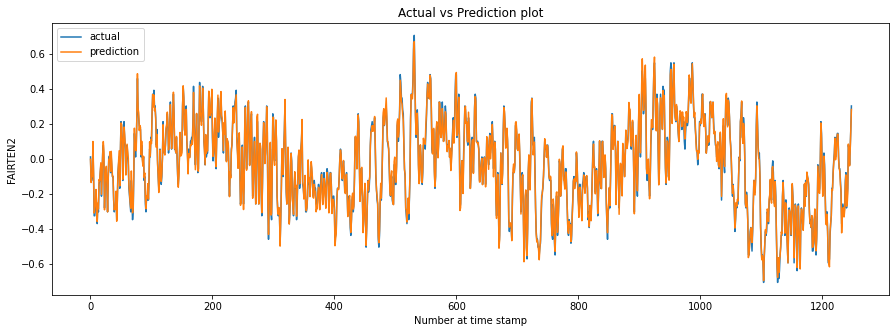

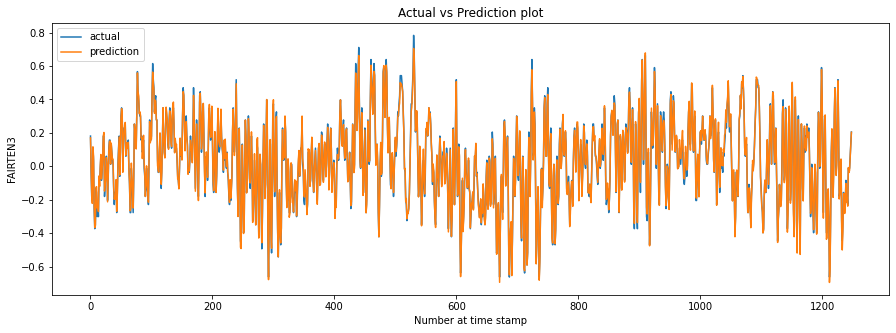

Epoch 28, Training loss 0.00006, Testing Loss 0.00006, Total time in Secs30


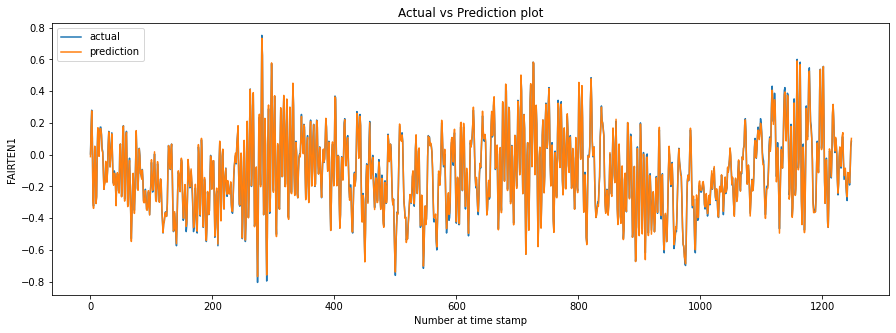

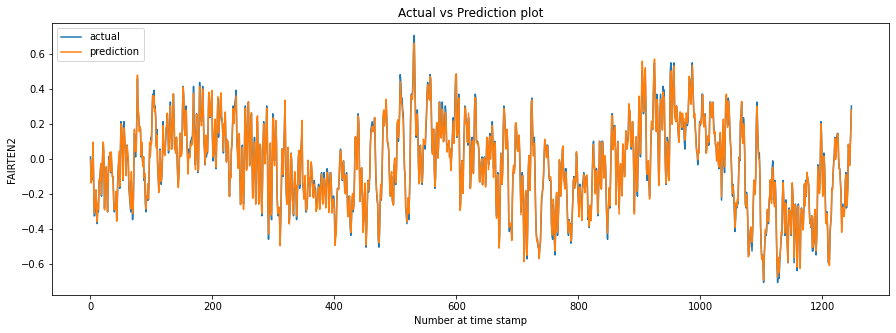

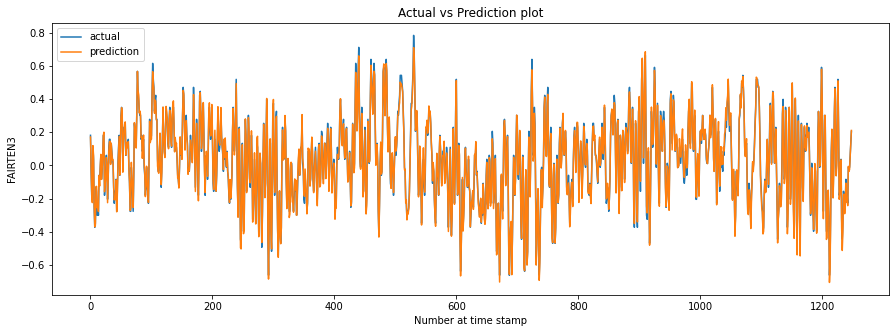

Epoch 29, Training loss 0.00006, Testing Loss 0.00006, Total time in Secs31


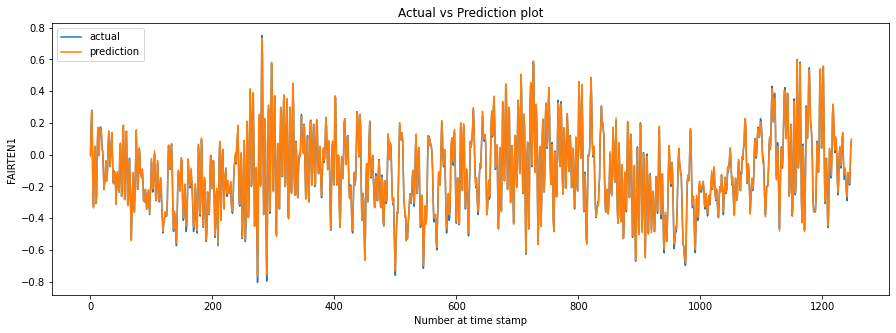

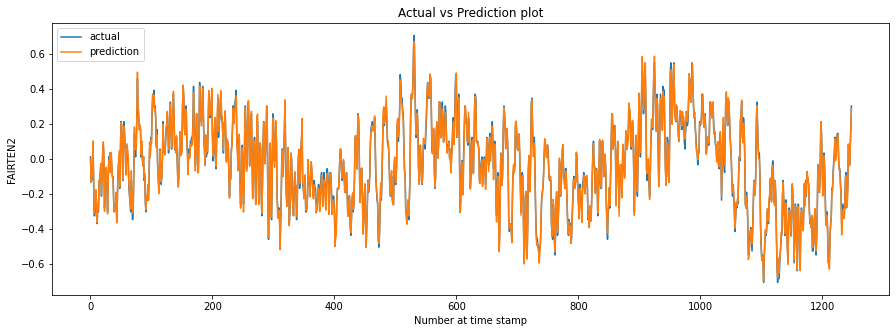

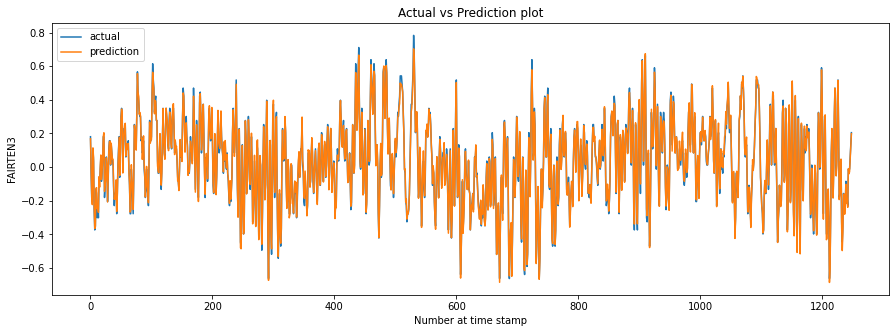

Epoch 30, Training loss 0.00006, Testing Loss 0.00005, Total time in Secs30


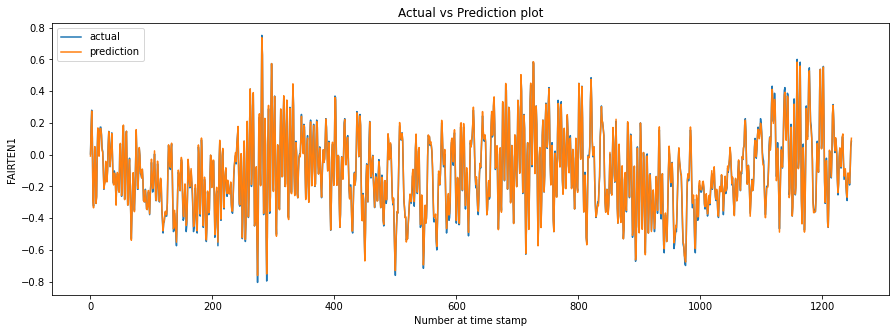

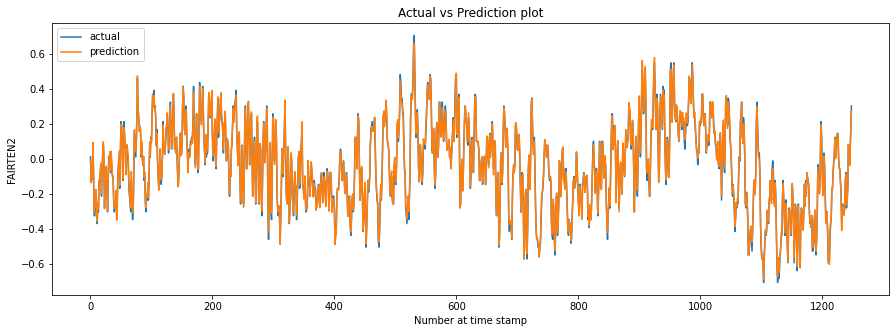

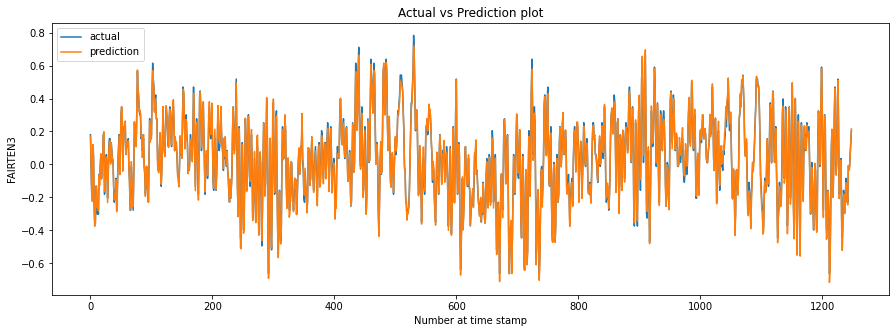

Epoch 31, Training loss 0.00006, Testing Loss 0.00006, Total time in Secs30


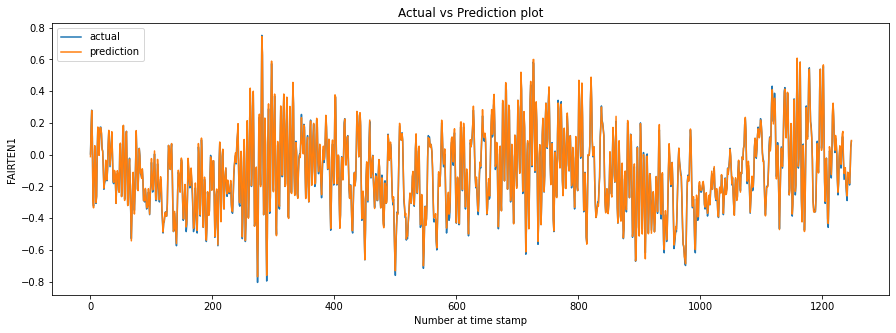

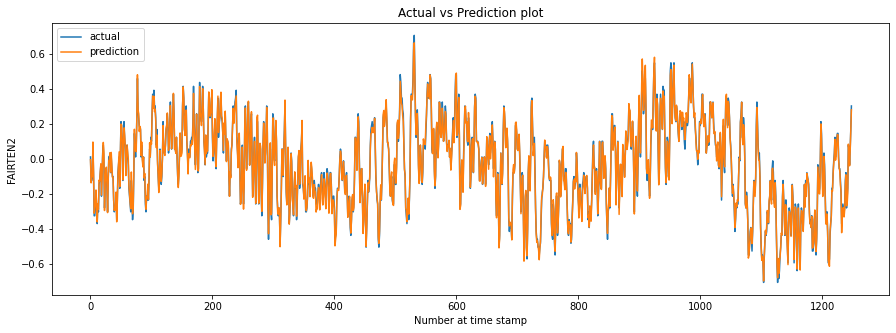

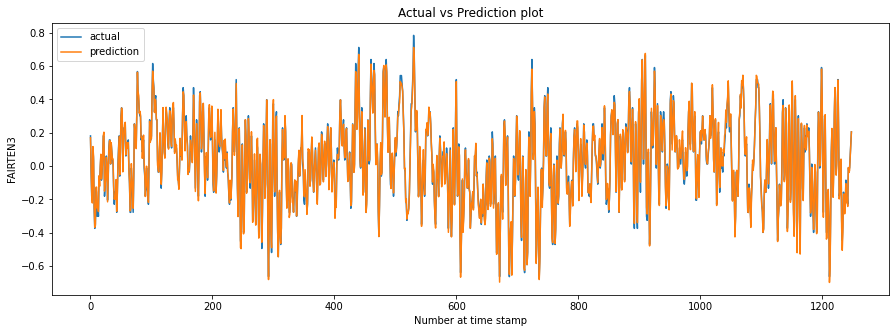

Epoch 32, Training loss 0.00006, Testing Loss 0.00005, Total time in Secs30


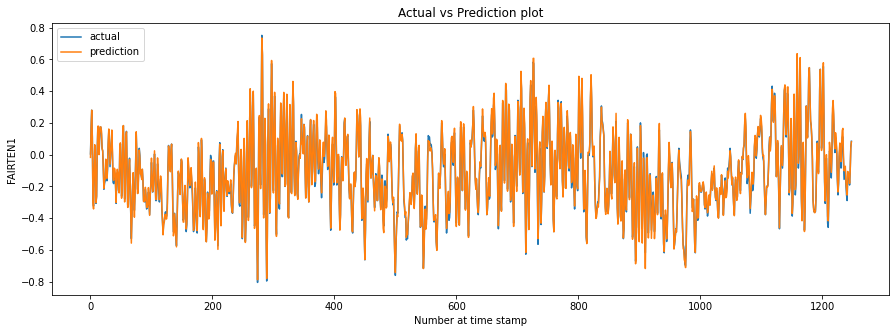

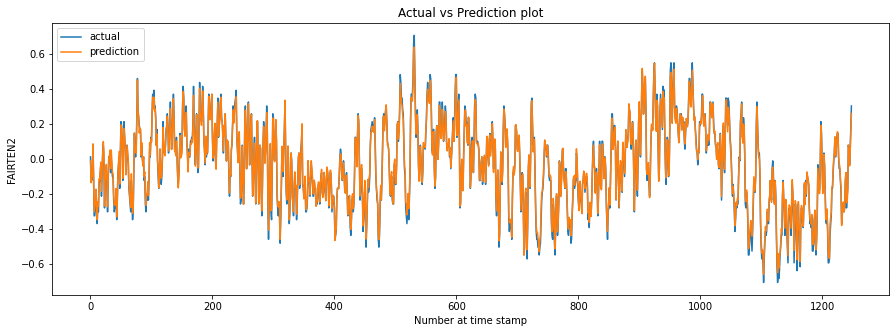

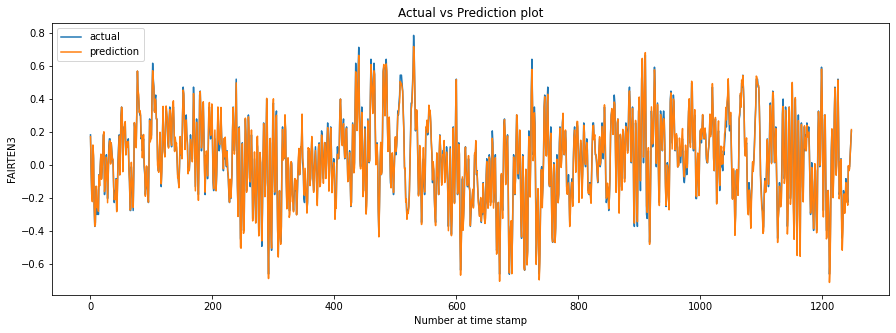

Epoch 33, Training loss 0.00006, Testing Loss 0.00008, Total time in Secs30


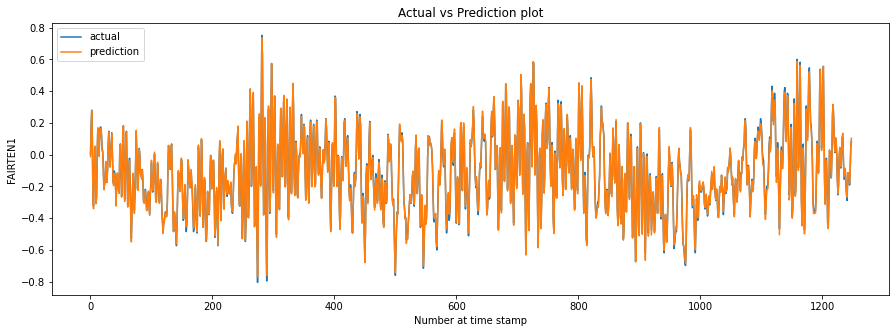

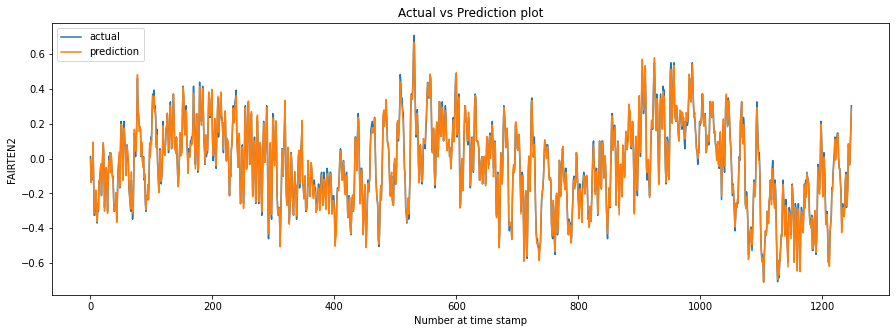

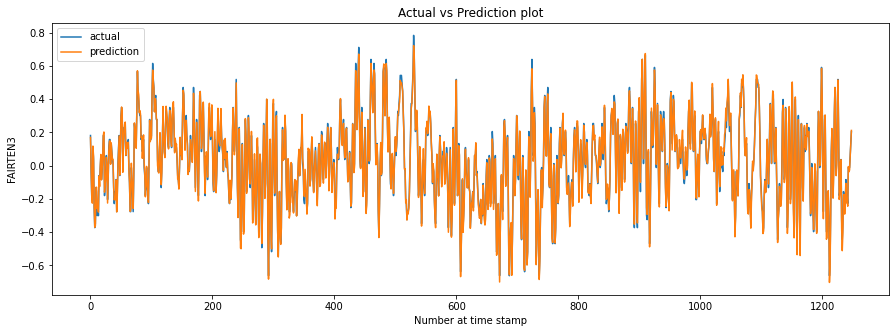

Epoch 34, Training loss 0.00006, Testing Loss 0.00006, Total time in Secs30


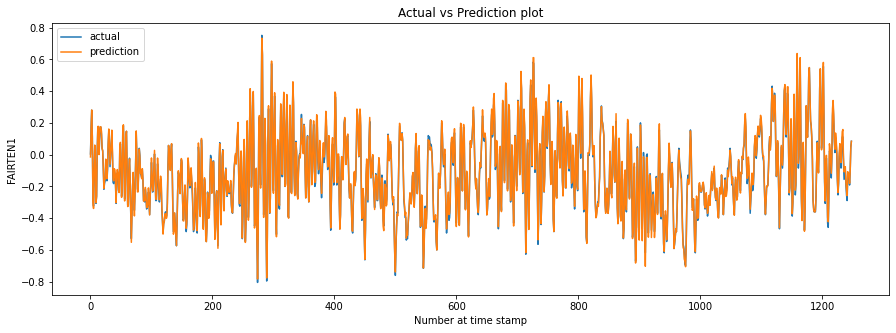

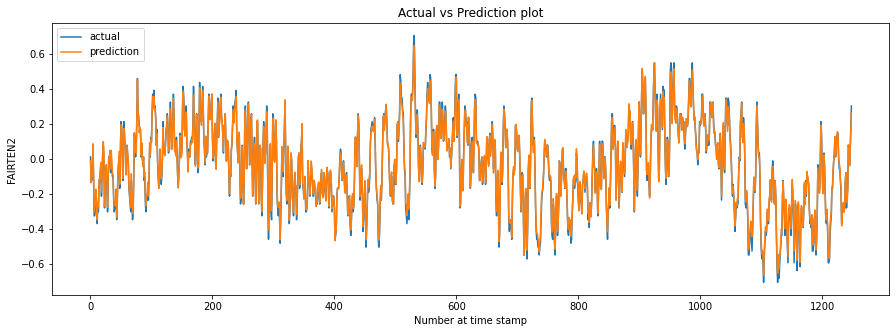

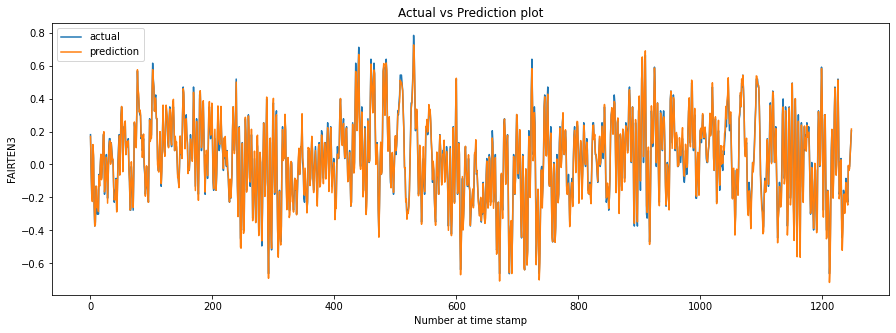

Epoch 35, Training loss 0.00006, Testing Loss 0.00007, Total time in Secs30


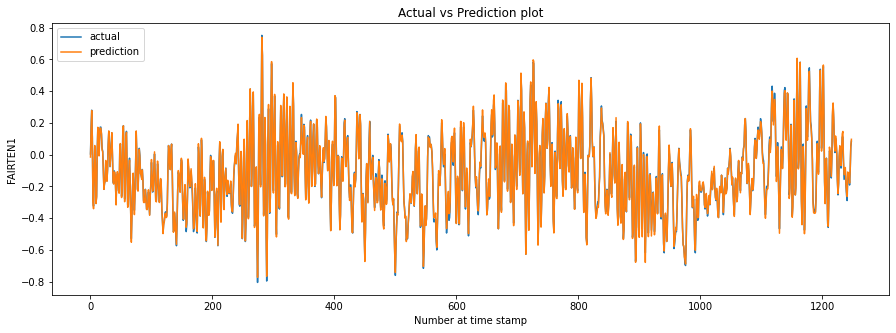

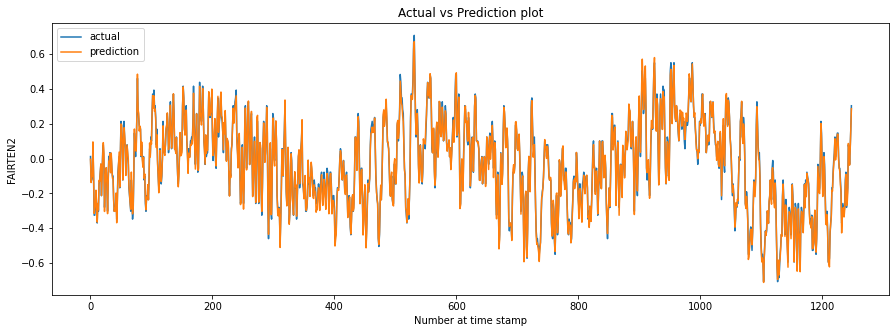

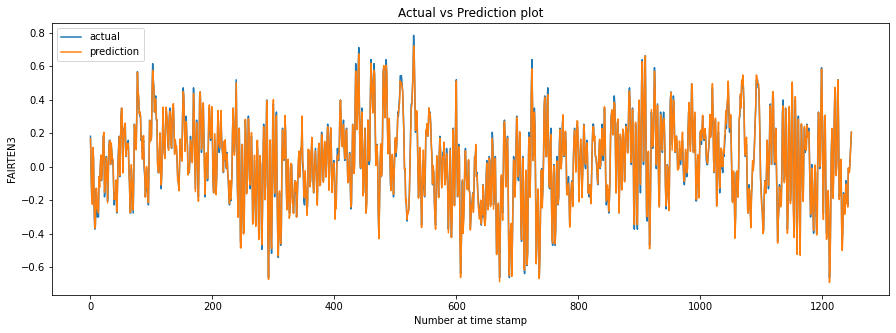

Epoch 36, Training loss 0.00006, Testing Loss 0.00005, Total time in Secs31


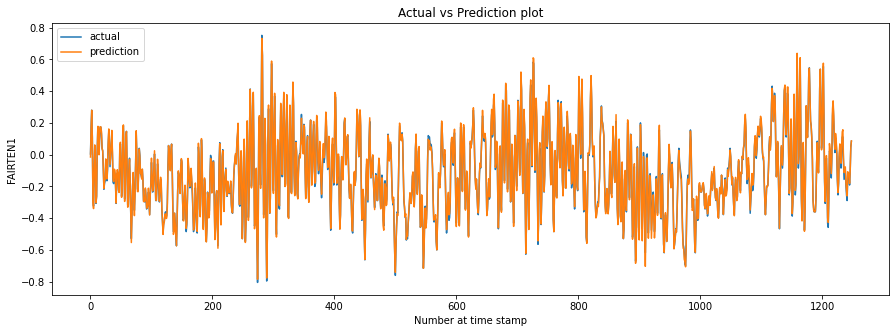

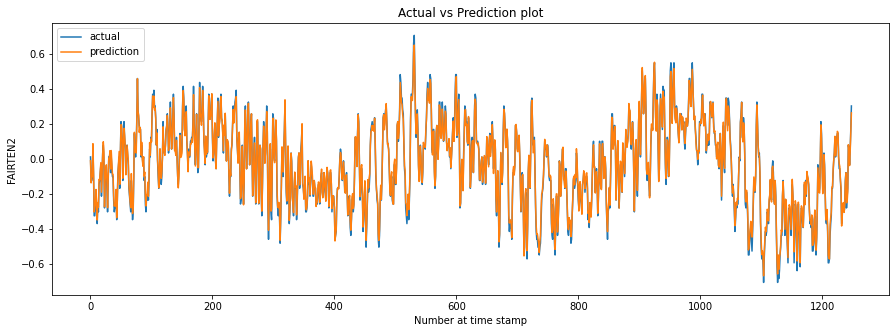

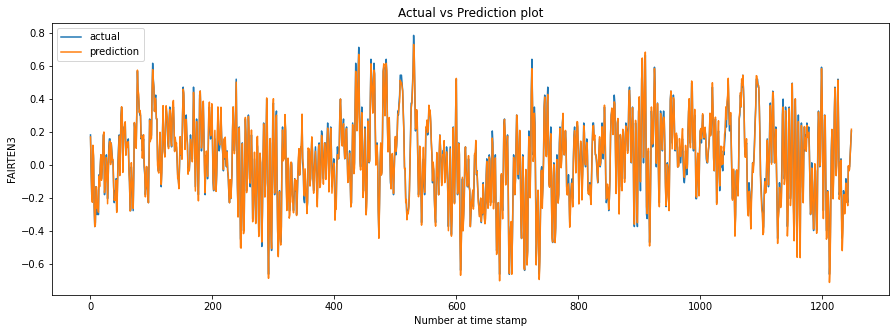

Epoch 37, Training loss 0.00005, Testing Loss 0.00007, Total time in Secs30


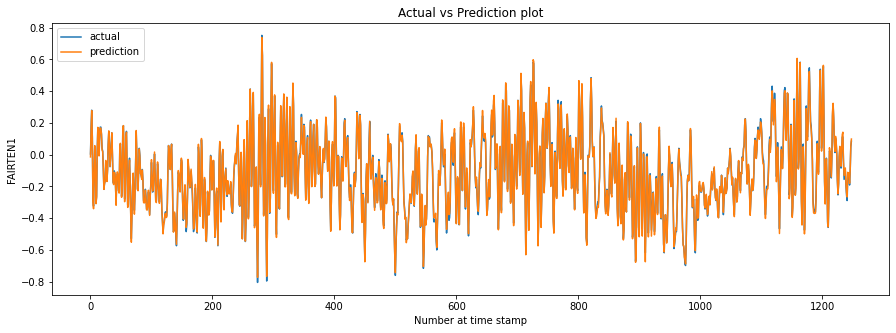

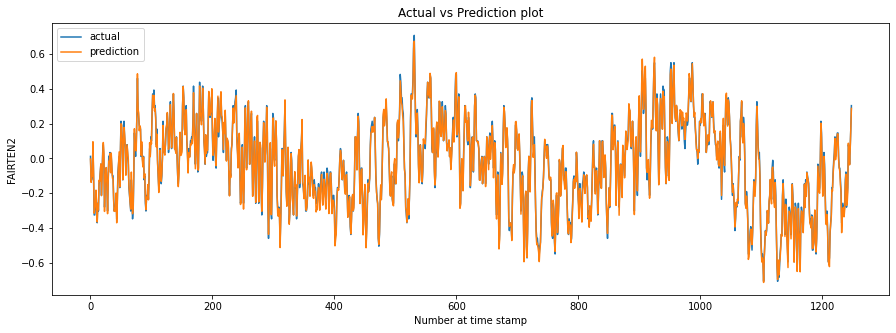

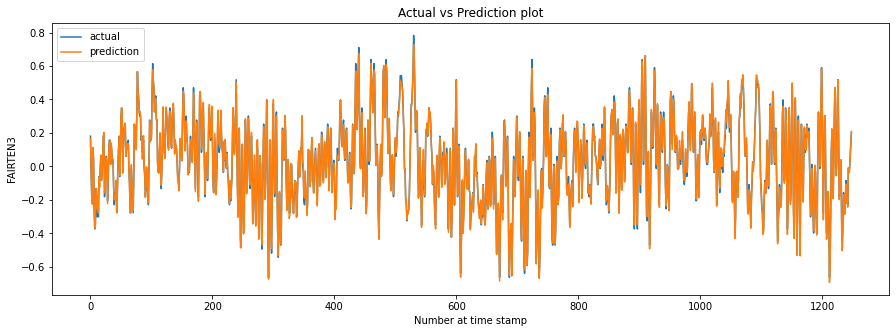

Epoch 38, Training loss 0.00005, Testing Loss 0.00005, Total time in Secs30


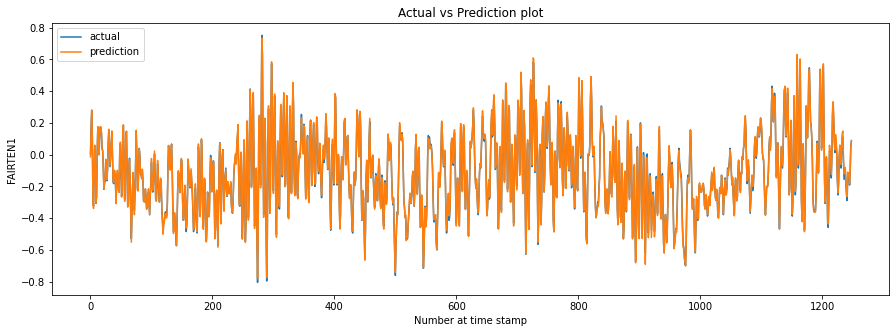

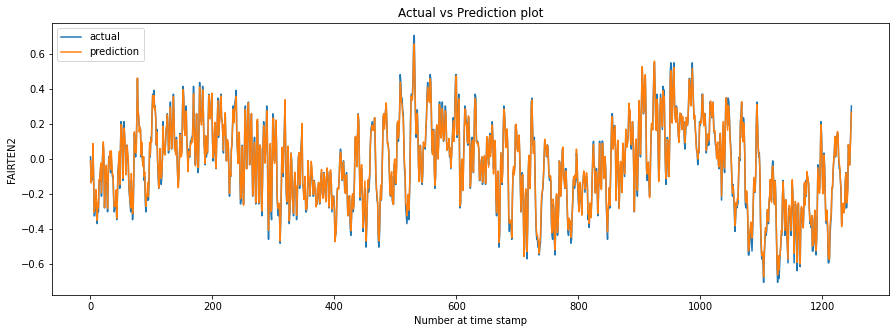

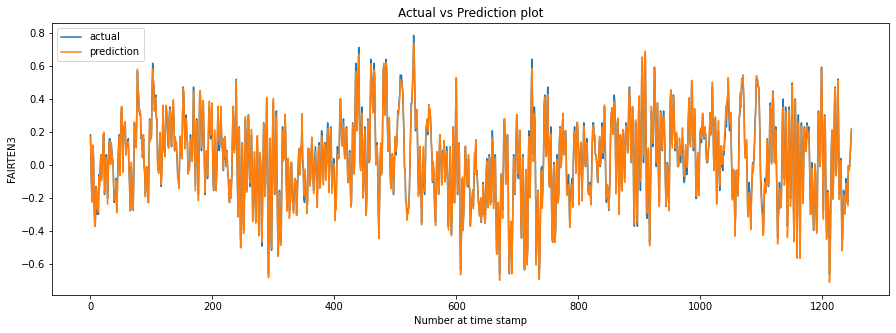

Epoch 39, Training loss 0.00005, Testing Loss 0.00007, Total time in Secs30


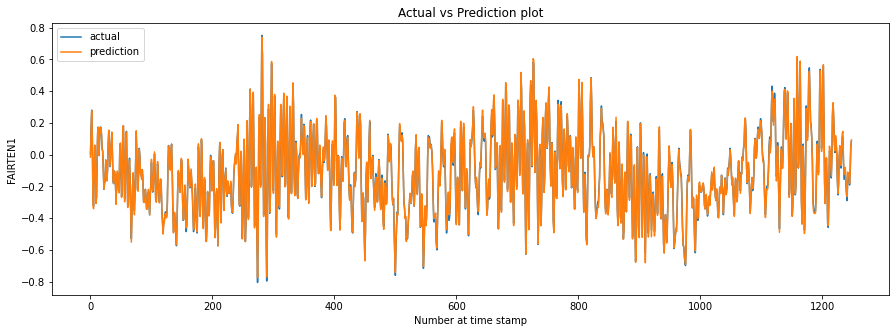

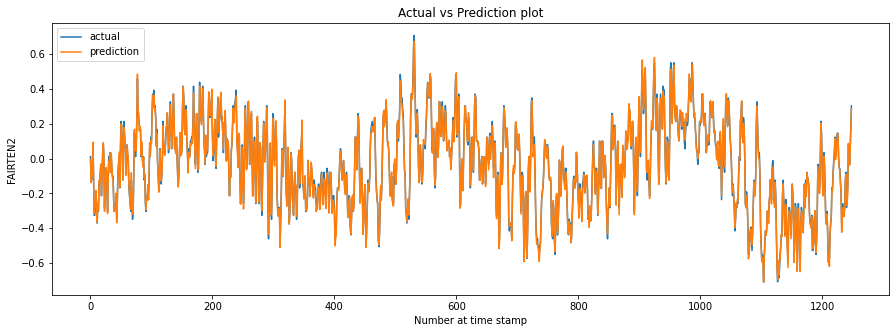

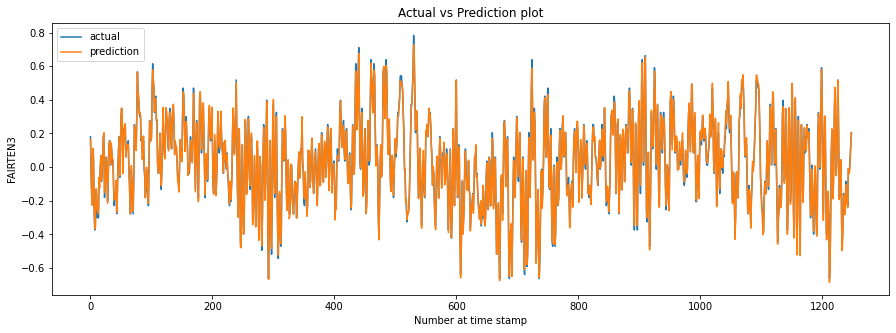

Epoch 40, Training loss 0.00005, Testing Loss 0.00005, Total time in Secs30


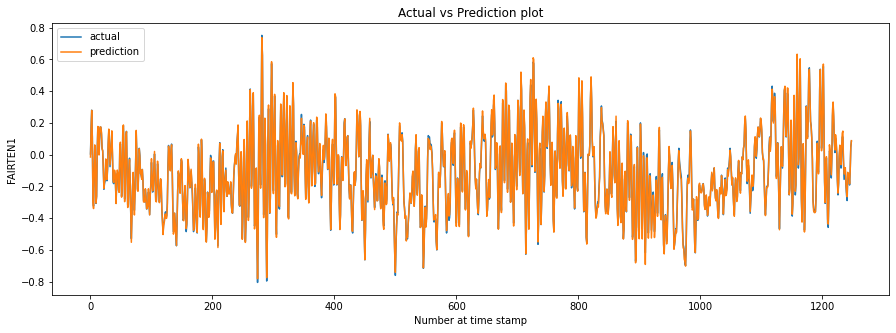

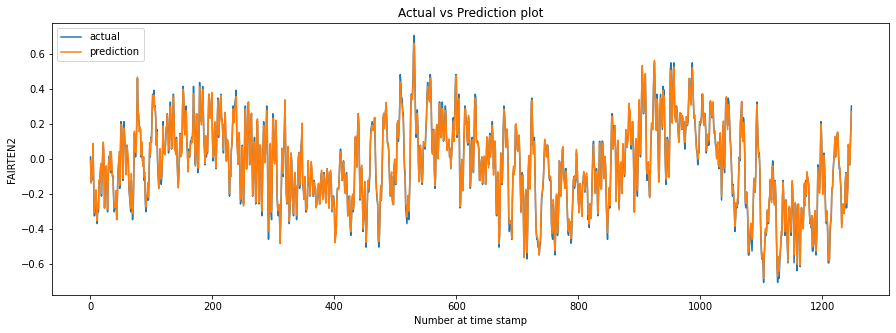

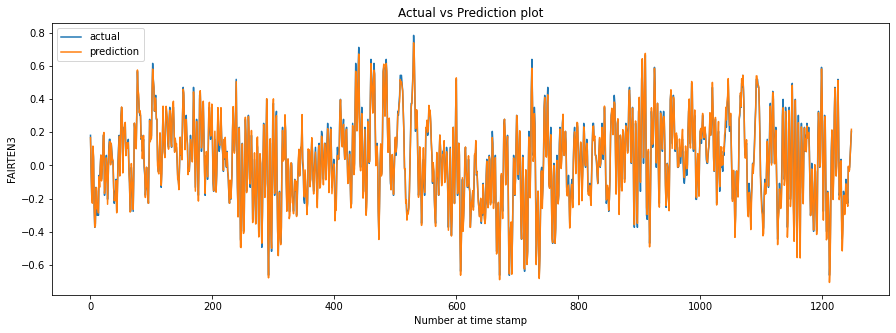

Epoch 41, Training loss 0.00005, Testing Loss 0.00006, Total time in Secs30


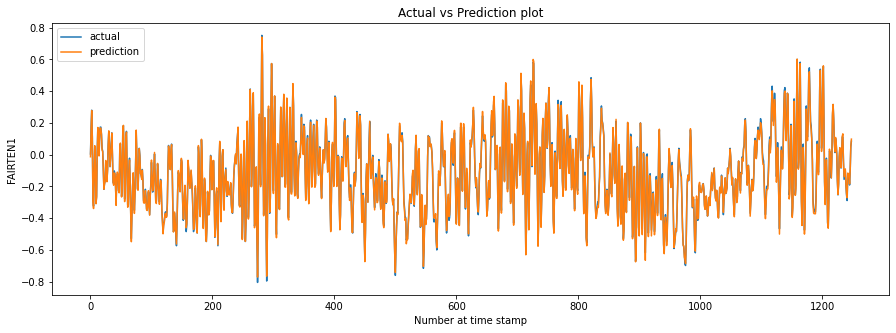

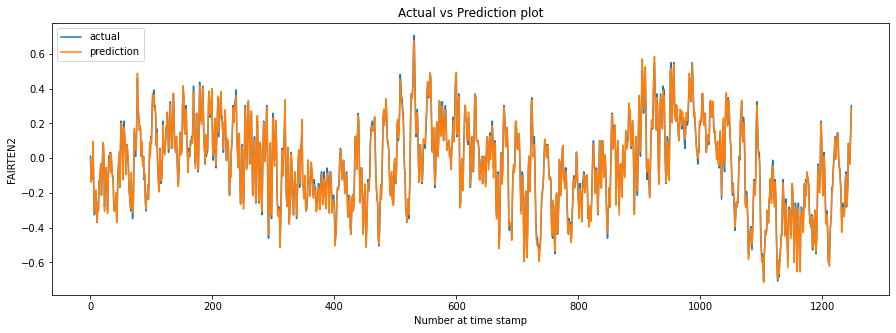

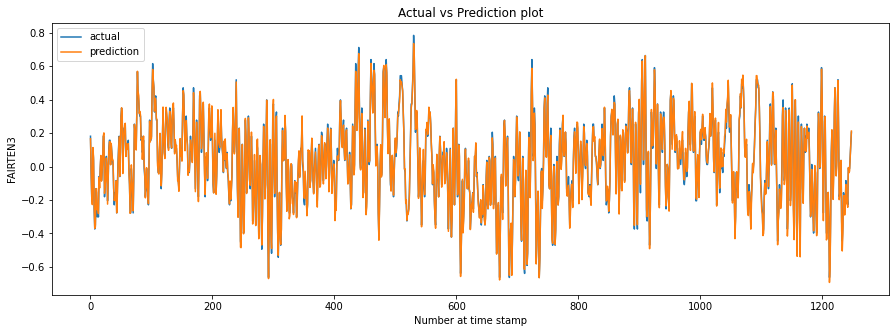

Epoch 42, Training loss 0.00005, Testing Loss 0.00005, Total time in Secs30


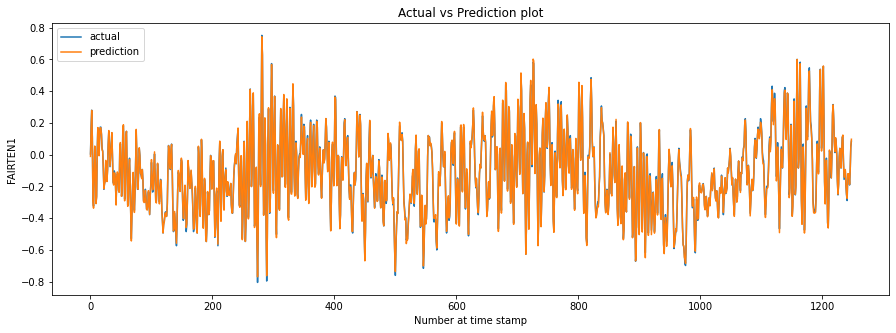

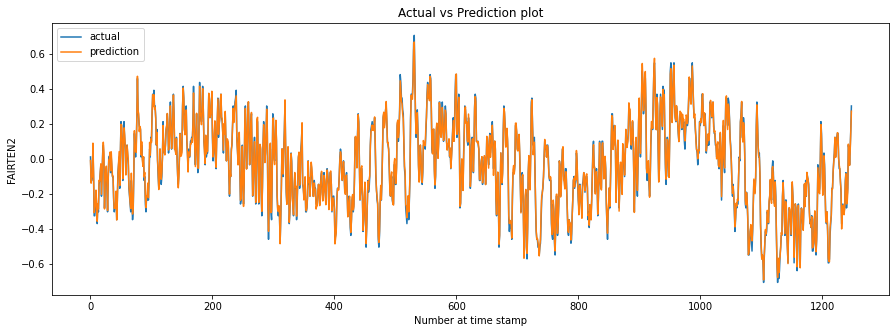

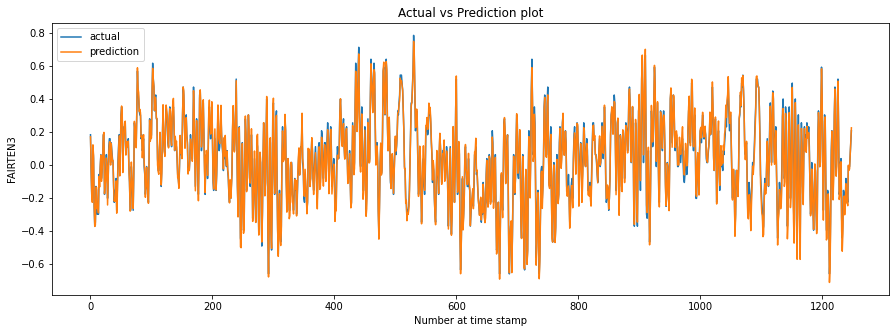

Epoch 43, Training loss 0.00005, Testing Loss 0.00006, Total time in Secs31


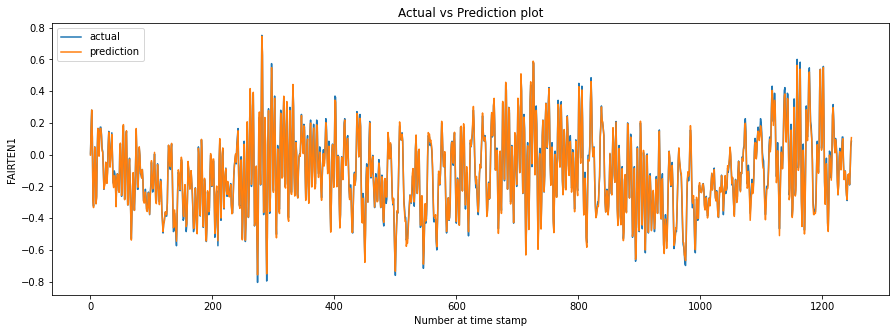

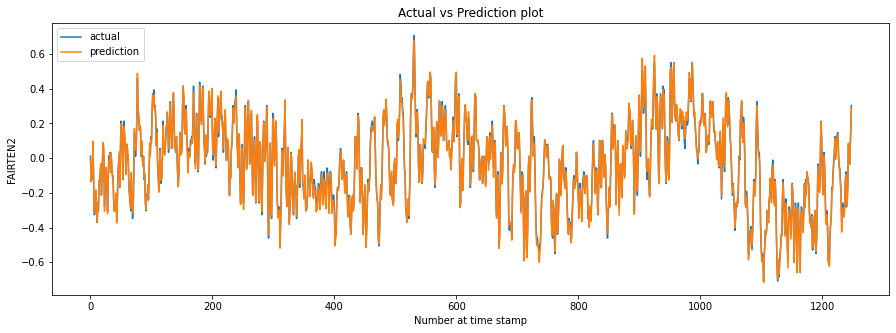

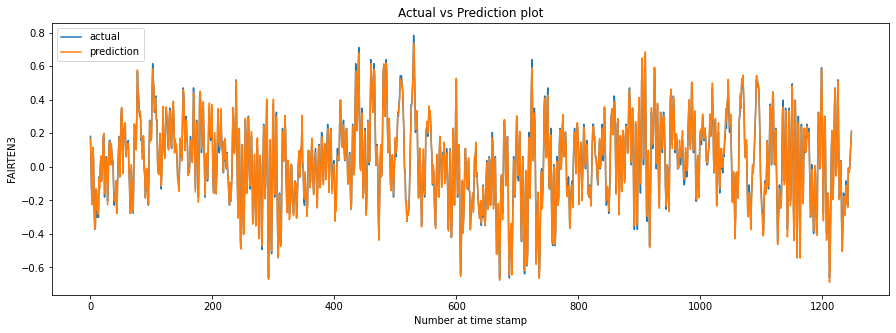

Epoch 44, Training loss 0.00005, Testing Loss 0.00006, Total time in Secs30


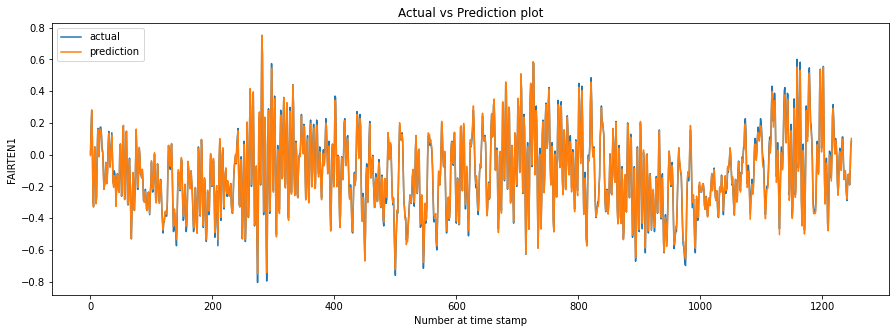

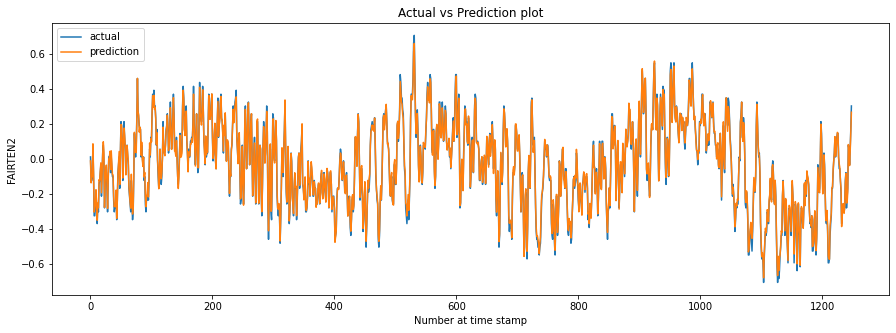

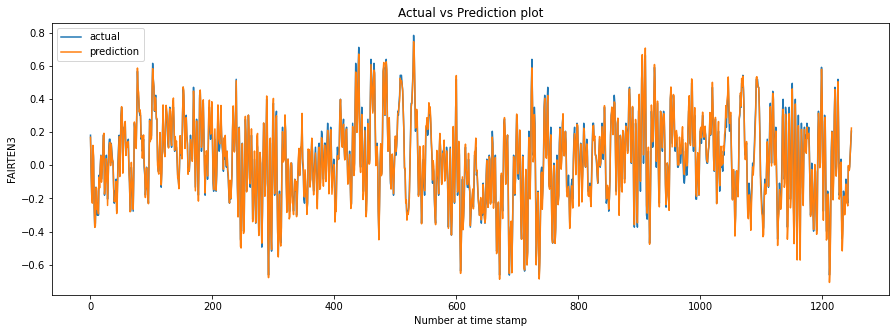

Epoch 45, Training loss 0.00005, Testing Loss 0.00007, Total time in Secs30


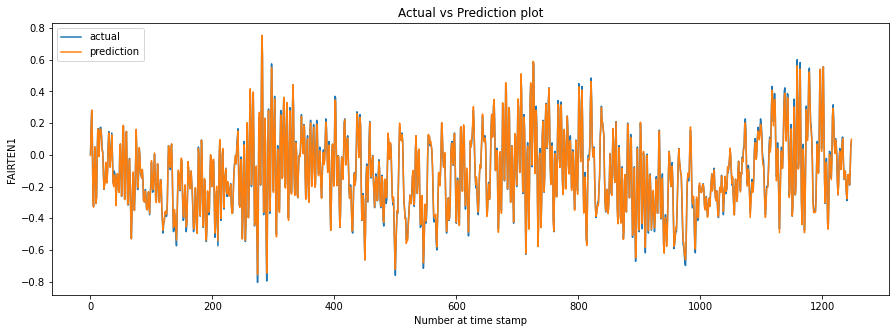

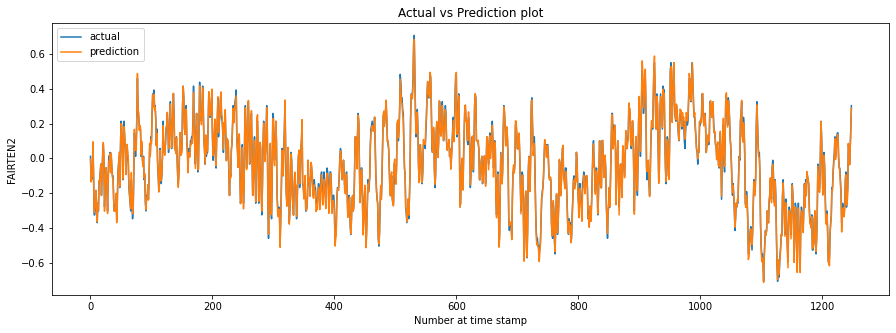

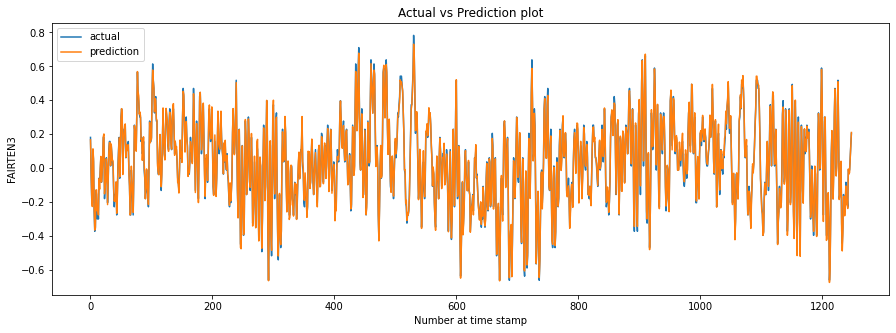

Epoch 46, Training loss 0.00005, Testing Loss 0.00005, Total time in Secs30


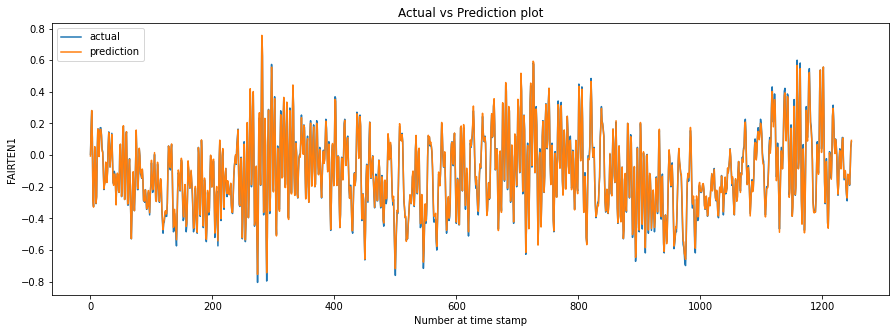

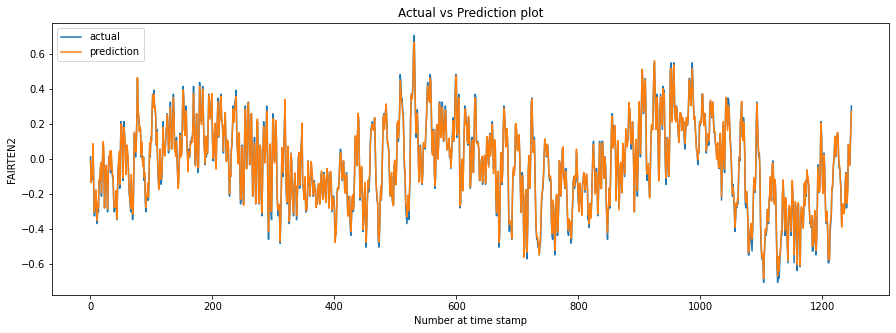

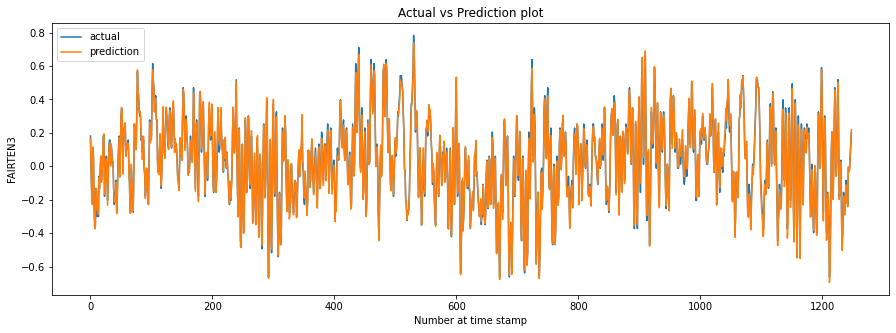

Epoch 47, Training loss 0.00005, Testing Loss 0.00005, Total time in Secs30


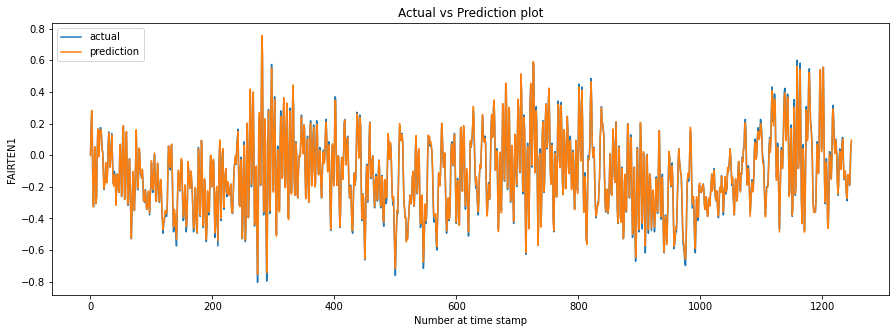

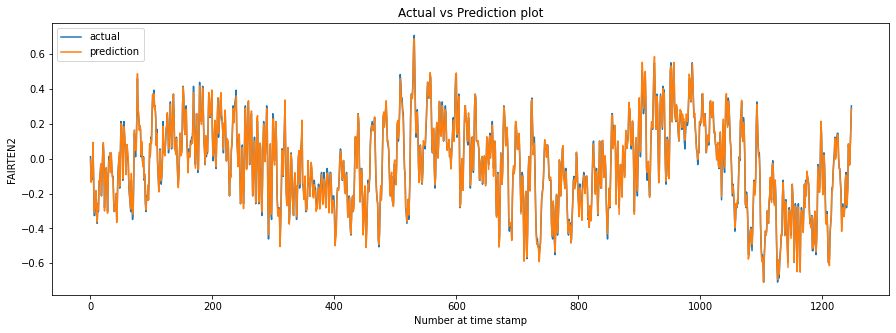

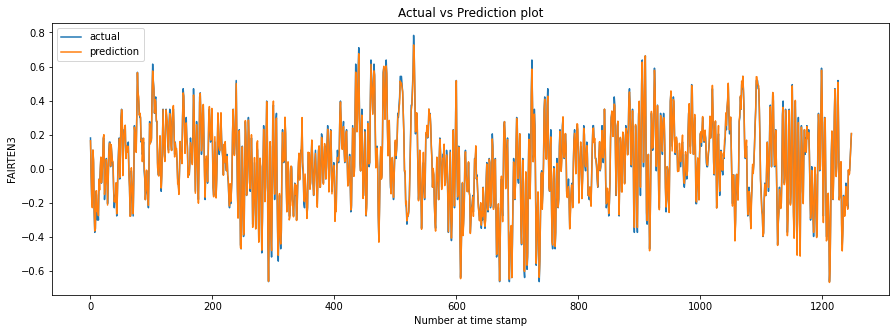

Epoch 48, Training loss 0.00005, Testing Loss 0.00004, Total time in Secs30


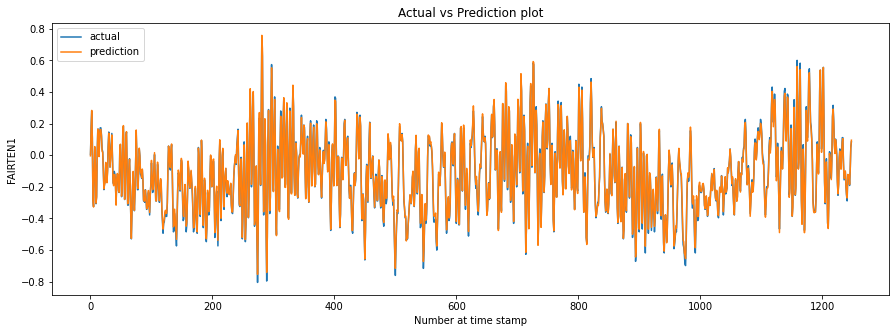

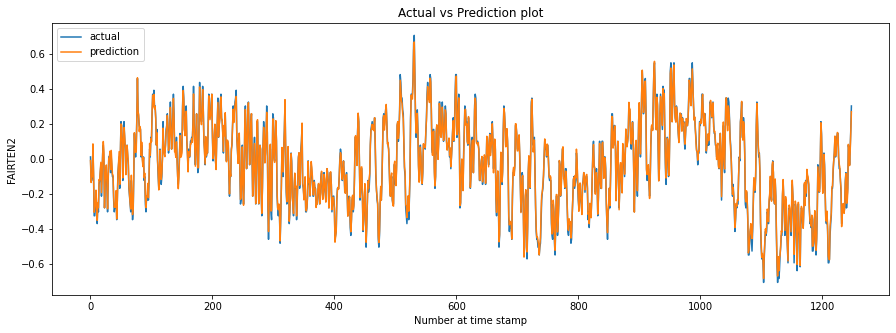

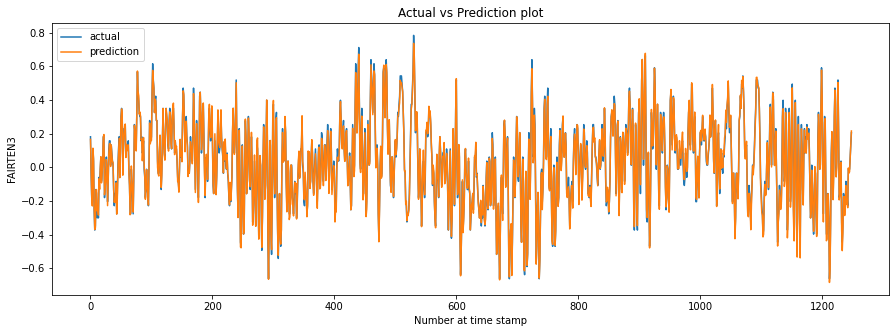

Epoch 49, Training loss 0.00005, Testing Loss 0.00005, Total time in Secs30


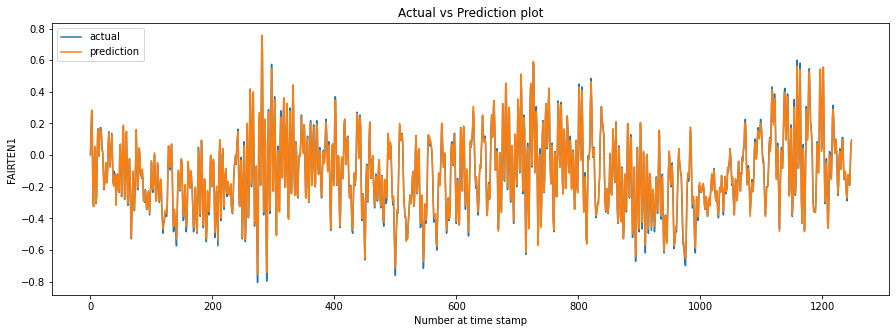

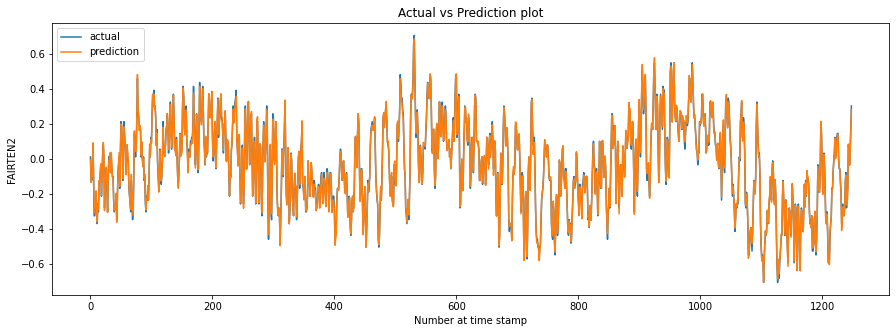

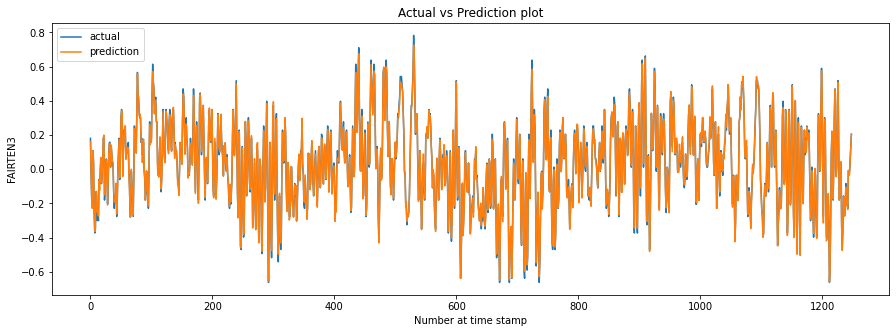

Epoch 50, Training loss 0.00005, Testing Loss 0.00004, Total time in Secs31
Best Model Loss, 4.116990285255349e-05


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

input_size = 9
sequence_len = 5
hidden_size = 256
num_targets = 3
num_layers = 3
learning_rate = 0.0001
class My_model(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, num_targets):
        super(My_model, self).__init__()
        self.input_size = input_size
        self.num_targets = num_targets
        self.num_layers = num_layers
        self.hidden_size = hidden_size
        # self.rnn = nn.RNN(input_size, hidden_size, num_layers, batch_first = True)
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first = True, bidirectional = False)
        self.fcc = nn.Linear(hidden_size, num_targets)
        self.sft = nn.Tanh()


    def forward(self, x):
        h0 = torch.zeros(self.num_layers , x.size(0), self.hidden_size).to(device)
        c0 = torch.zeros(self.num_layers , x.size(0), self.hidden_size).to(device)
        out, _ = self.lstm(x,(h0, c0))
        out = out[:,-1,:]
        out = self.sft(out)
        out = self.sft(self.fcc(out))
        return out

model = My_model(input_size, hidden_size,num_layers, num_targets).to(device)
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr = learning_rate)


best_loss = 10000000000000000000
t_loss = []
te_loss = []
running_loss = 0.0
test_loss = 0.0
running_correct = 0
curr_sample = 0
n_epochs = 50
num_iter = math.ceil((final_df.n_samples) / train_loader.batch_size)
for epoch in range(n_epochs):
    running_loss = 0
    start_time = time.time()
    for i,(features, targets) in enumerate(train_loader):
      # if features.shape == torch.Size([1, 5, 9]):
        features = features.to(device)
        targets = targets.to(device)
        features = features.reshape(-1, sequence_len, input_size)
        out = model(features)
        loss = criterion(out,targets)
        # print(loss)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
    test_loss = 0

    # epoch_loss = running_loss / (final_df.n_samples)
    # total_secs = int(time.time() - start_time)

    target_1 = []
    target_2 = []
    target_3 = []
    pred_1 = []
    pred_2 = []
    pred_3 = []

    for (features, targets) in test_loader:
      # if features.shape == torch.Size([1, 5, 9]):
        with torch.no_grad():
            features = features.to(device)
            features = features.reshape(-1, sequence_len, input_size)
            targets = targets.to(device)
            out = model(features)
            loss = (criterion(out,targets))
            test_loss += loss.item()

            targets = targets.to('cpu').numpy()
            out = out.detach().to('cpu').numpy()
            pred_1.append(out[0][0])
            pred_2.append(out[0][1])
            pred_3.append(out[0][2])
            target_1.append(targets[0][0])
            target_2.append(targets[0][1])
            target_3.append(targets[0][2])

    epoch_loss = running_loss / (final_df.n_samples)
    epoch_test_loss = test_loss /(final_df_test.n_samples)
    total_secs = int(time.time() - start_time)


    plt.figure(figsize = (15,5))
    plt.plot(target_1)
    plt.plot(pred_1)
    # plt.plot(target_3)
    plt.title('Actual vs Prediction plot')
    plt.ylabel('FAIRTEN1')
    plt.xlabel('Number at time stamp')
    plt.legend(['actual', 'prediction'], loc='upper left')
    plt.show()
    plt.figure(figsize = (15,5))
    plt.plot(target_2)
    plt.plot(pred_2)
    # plt.plot(target_3)
    plt.title('Actual vs Prediction plot')
    plt.ylabel('FAIRTEN2')
    plt.xlabel('Number at time stamp')
    plt.legend(['actual', 'prediction'], loc='upper left')
    plt.show()
    plt.figure(figsize = (15,5))
    plt.plot(target_3)
    plt.plot(pred_3)
    # plt.plot(target_3)
    plt.title('Actual vs Prediction plot')
    plt.ylabel('FAIRTEN3')
    plt.xlabel('Number at time stamp')
    plt.legend(['actual', 'prediction'], loc='upper left')
    plt.show()




    if best_loss > epoch_test_loss:
      best_loss = epoch_test_loss
      best_model = deepcopy(model)

    t_loss.append(epoch_loss)
    te_loss.append(epoch_test_loss)
    print(f'Epoch {epoch+1}, Training loss {epoch_loss:.5f}, Testing Loss {epoch_test_loss:.5f}, Total time in Secs{total_secs}')

print(f'Best Model Loss, {best_loss}')



In [ ]:
FILE = "/content/drive/MyDrive/LSTM_50_epoch_8_batch_4mps.pth"
torch.save(model.state_dict(), FILE)
FILE2 = "/content/drive/MyDrive/LSTM_50_epoch_8_batch_4mpsmodel_best_model.pth"
torch.save(best_model.state_dict(), FILE2)

In [ ]:
FILE = "LSTM_25_epoch_4mps.pth"
torch.save(model.state_dict(), FILE)
FILE2 = "LSTM_25_epoch_4mpsmodel_best_model.pth"
torch.save(best_model.state_dict(), FILE2)

<function matplotlib.pyplot.show(*args, **kw)>

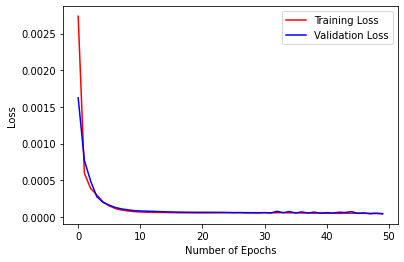

In [ ]:
plt.plot(np.array(t_loss), 'r', label = "Training Loss")
plt.plot(np.array(te_loss), 'b', label = 'Validation Loss')
plt.xlabel('Number of Epochs')
plt.legend(loc='upper right')
plt.ylabel('Loss')
plt.show

In [ ]:
for i in te_loss:
  print(i)

0.001624431932444421
0.00077066911965526
0.0004913233719173725
0.0002749289438051879
0.0002001725139541296
0.00016039106074960187
0.00012836336263387786
0.0001091873276130609
9.637477393901213e-05
8.610903494855006e-05
8.119347508887198e-05
7.841118584223237e-05
7.603110999485877e-05
7.320654003251047e-05
7.031913204197626e-05
6.782179877883337e-05
6.589360087600209e-05
6.446667105617352e-05
6.352270966753897e-05
6.295156537519542e-05
6.271298174424768e-05
6.280270523341271e-05
6.278722606880573e-05
6.180375951831021e-05
6.0569937916203154e-05
5.787592203612045e-05
5.9117694962624764e-05
5.5516782629676386e-05
5.6587540615859166e-05
5.467741123281475e-05
5.91789087310606e-05
5.339813997359928e-05
7.692562097892208e-05
5.672713416314315e-05
7.332796845489891e-05
5.401551031995473e-05
6.855312258024884e-05
5.356806947710934e-05
6.535952355893901e-05
5.1067436643305914e-05
5.9030831269333894e-05
5.345183925625596e-05
6.349506800883351e-05
6.030613749803331e-05
7.23461278766148e-05
4.83493

In [ ]:
for i in t_loss:
  print(i)

0.002736764653045907
0.0005963793441949967
0.0003890866733064393
0.00030116162611094324
0.00020472006837749182
0.0001504884580301516
0.00011358487856221949
9.358942850514149e-05
8.142926864369755e-05
7.305657799659743e-05
6.765381743458574e-05
6.447783168033257e-05
6.24206072667944e-05
6.097294195188228e-05
5.97202939282229e-05
5.8588533567253615e-05
5.7577319367133746e-05
5.672024018960744e-05
5.605875066566877e-05
5.565980692599458e-05
5.557489814819045e-05
5.5839107390790954e-05
5.6465536252835135e-05
5.745718673282683e-05
5.846708884305539e-05
5.8963151993477874e-05
5.861645902297135e-05
5.941813754034437e-05
5.8080195497851034e-05
5.827361679701324e-05
5.7246777590344626e-05
5.6739335763470934e-05
5.7281665345566134e-05
5.9347734408241075e-05
5.533326747087523e-05
5.722619287230907e-05
5.353444619987883e-05
5.4680794869381875e-05
5.1444783429220494e-05
5.2874116627611345e-05
4.959874532778843e-05
5.01772011978984e-05
4.7955814065447164e-05
5.015066900280068e-05
4.9941109282359056e

In [ ]:
  import os
import pandas as pd

folderpath = "/content/drive/MyDrive/CSIR Data"
filepaths = [os.path.join(folderpath, name) for name in os.listdir(folderpath)]
for path in filepaths:
  dx = pd.read_csv(path, delimiter = '\t', skiprows = 5)
  dx.drop(0, inplace = True)
  dx = dx.astype('float64')
  print(dx.shape)
  print(path)

/usr/local/lib/python3.8/dist-packages/IPython/core/interactiveshell.py:3326: DtypeWarning: Columns (0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


(92001, 204)
/content/drive/MyDrive/CSIR Data/Copy of 15MW_Semi_20.out
(92001, 204)
/content/drive/MyDrive/CSIR Data/Copy of 15MW_Semi_22.out
(92001, 204)
/content/drive/MyDrive/CSIR Data/Copy of 15MW_Semi_24.out
(92001, 204)
/content/drive/MyDrive/CSIR Data/Copy of 15MW_Semi_8.out
(92001, 204)
/content/drive/MyDrive/CSIR Data/Copy of 15MW_Semi_10.out
(92001, 204)
/content/drive/MyDrive/CSIR Data/Copy of 15MW_Semi_12.out
(92001, 204)
/content/drive/MyDrive/CSIR Data/Copy of 15MW_Semi_14.out
(92001, 204)
/content/drive/MyDrive/CSIR Data/Copy of 15MW_Semi_16.out
(92001, 204)
/content/drive/MyDrive/CSIR Data/Copy of 15MW_Semi_18.out
(92001, 204)
/content/drive/MyDrive/CSIR Data/Copy of 15MW_Semi_4.out
(92001, 204)
/content/drive/MyDrive/CSIR Data/Copy of 15MW_Semi_6.out


In [ ]:
!pip install torchmetrics
from torchmetrics import MeanSquaredLogError, MeanAbsolutePercentageError, MeanSquaredError
mean_squared_log_error = MeanSquaredLogError()
mean_abs_percentage_error = MeanAbsolutePercentageError()
mean_squared_error = MeanSquaredError()



Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 512 kB 14.7 MB/s 


In [ ]:
fair_1_res = []
fair_2_res = []
fair_3_res = []

mlse_1 = []
mlse_2 = []
mlse_3 = []

mape_1 = []
mape_2 = []
mape_3 = []

mse_1 = []
mse_2 = []
mse_3 = []
import os
import pandas as pd
import warnings
warnings.simplefilter('ignore')

folderpath = "/content/drive/MyDrive/CSIR Data"
filepaths = [os.path.join(folderpath, name) for name in os.listdir(folderpath)]
for path in filepaths:
  dx = pd.read_csv(path, delimiter = '\t', skiprows = 5)
  dx.drop(0, inplace = True)
  dx = dx.astype('float64')
  print(dx.shape)
  print(path)


  X = dx.loc[:,["PtfmSurge","PtfmSway","PtfmHeave","PtfmRoll","PtfmPitch","PtfmYaw","FAIRTEN1","FAIRTEN2","FAIRTEN3"]]
  y = dx.loc[:,["FAIRTEN1","FAIRTEN2","FAIRTEN3"]]

  col = ["PtfmSurge","PtfmSway","PtfmHeave","PtfmRoll","PtfmPitch","PtfmYaw","FAIRTEN1","FAIRTEN2","FAIRTEN3"]


  from sklearn.preprocessing import MinMaxScaler
  std_scaler_for_test = MinMaxScaler(feature_range=(-1, 1))


  X_unscaled = X.loc[2001:,:]
  X_scaled = std_scaler_for_test.fit_transform(X_unscaled)
  # X_scaled = std_scaler.transform(X_unscaled)
  X_scaled = pd.DataFrame(X_scaled, columns=col)
  X_scaled = X_scaled.astype('float64')


  final_df = ABCD(X_scaled, transform= TOtensor())

  def inverseify(initials, last = None, col = ["PtfmSurge","PtfmSway","PtfmHeave","PtfmRoll","PtfmPitch","PtfmYaw","FAIRTEN1","FAIRTEN2","FAIRTEN3"]):
    last = np.array(last)
    full = np.concatenate((initials, last), axis=1)
    X_rev = std_scaler_for_test.inverse_transform(full)
    X_rev = pd.DataFrame(X_rev, columns=col)
    X_rev = X_rev.astype('float64')
    return X_rev

  test_loader_new_dataset = DataLoader(dataset=final_df,
                            batch_size=8,
                            shuffle=False,
                            num_workers= 0)
  target_1 = []
  target_2 = []
  target_3 = []
  pred_1 = []
  pred_2 = []
  pred_3 = []
  feature_list = []
  i = 0
  for i,(features, targets) in enumerate(test_loader_new_dataset):
    # if features.shape == torch.Size([1, 9]):
          with torch.no_grad():
              features = features.to(device)
              features = features.reshape(-1, sequence_len, input_size)
              targets = targets.to(device)
              out = best_model(features)

              features = features.to('cpu').numpy()
              targets = targets.to('cpu').numpy()
              out = out.detach().to('cpu').numpy()

              # print(features.shape)
              for j in range(features.shape[0]):
                features_1 = features[j][0]
                features_1 = features_1[:-3]
                feature_list.append(features_1)



              for j in range(out.shape[0]):
                pred_1.append(out[j][0])
                pred_2.append(out[j][1])
                pred_3.append(out[j][2])

                target_1.append(targets[j][0])
                target_2.append(targets[j][1])
                target_3.append(targets[j][2])
              # if i % 10000 == 0:
              #   print(i, len(feature_list))


  i = i+1

  print(len(target_1))



  target_1 = np.array(target_1).reshape((-1,1))
  target_2 = np.array(target_2).reshape((-1,1))
  target_3 = np.array(target_3).reshape((-1,1))
  pred_1 = np.array(pred_1).reshape((-1,1))
  pred_2 = np.array(pred_2).reshape((-1,1))
  pred_3 = np.array(pred_3).reshape((-1,1))
  feature_list = np.array(feature_list).reshape((-1,6))

  from sklearn import metrics
  print("Results Scaled")
  print("Fairten1",metrics.r2_score(target_1,pred_1))
  print("Fairten2",metrics.r2_score(target_2,pred_2))
  print("Fairten3",metrics.r2_score(target_3,pred_3))


  fair_1_res.append(metrics.r2_score(target_1,pred_1))
  fair_2_res.append(metrics.r2_score(target_2,pred_2))
  fair_3_res.append(metrics.r2_score(target_3,pred_3))

  t = np.concatenate((target_1, target_2, target_3),axis = 1)
  unscaled_data_target = inverseify(feature_list,t)

  q = np.concatenate((pred_1, pred_2,pred_3),axis = 1)
  unscaled_data_pred = inverseify(feature_list,q)

  # print("Results UNScaled")
  # print("Fairten1",metrics.r2_score(unscaled_data_target.iloc[:,-3].to_numpy(),unscaled_data_pred.iloc[:,-3].to_numpy()))
  # print("Fairten2",metrics.r2_score(unscaled_data_target.iloc[:,-2].to_numpy(),unscaled_data_pred.iloc[:,-2].to_numpy()))
  # print("Fairten3",metrics.r2_score(unscaled_data_target.iloc[:,-1].to_numpy(),unscaled_data_pred.iloc[:,-1].to_numpy()))

  temp1 = mean_squared_log_error(torch.from_numpy(unscaled_data_target.iloc[:,-3].to_numpy()), torch.from_numpy(unscaled_data_pred.iloc[:,-3].to_numpy()))
  temp2 =mean_squared_log_error(torch.from_numpy(unscaled_data_target.iloc[:,-2].to_numpy()), torch.from_numpy(unscaled_data_pred.iloc[:,-2].to_numpy()))
  temp3 = mean_squared_log_error(torch.from_numpy(unscaled_data_target.iloc[:,-1].to_numpy()), torch.from_numpy(unscaled_data_pred.iloc[:,-1].to_numpy()))

  mlse_1.append(temp1)
  mlse_2.append(temp2)
  mlse_3.append(temp3)

  print("MLSE SCore 1",temp1)
  print("MLSE SCore 2",temp2)
  print("MLSE SCore 3",temp3)

  temp1 = mean_abs_percentage_error(torch.from_numpy(unscaled_data_target.iloc[:,-3].to_numpy()), torch.from_numpy(unscaled_data_pred.iloc[:,-3].to_numpy()))
  temp2 =mean_abs_percentage_error(torch.from_numpy(unscaled_data_target.iloc[:,-2].to_numpy()), torch.from_numpy(unscaled_data_pred.iloc[:,-2].to_numpy()))
  temp3 = mean_abs_percentage_error(torch.from_numpy(unscaled_data_target.iloc[:,-1].to_numpy()), torch.from_numpy(unscaled_data_pred.iloc[:,-1].to_numpy()))

  mape_1.append(temp1)
  mape_2.append(temp2)
  mape_3.append(temp3)
  print("MAPE SCore 1",temp1)
  print("MAPE SCore 2",temp2)
  print("MAPE SCore 3",temp3)

  temp1 = mean_squared_error(torch.from_numpy(unscaled_data_target.iloc[:,-3].to_numpy()), torch.from_numpy(unscaled_data_pred.iloc[:,-3].to_numpy()))
  temp2 =mean_squared_error(torch.from_numpy(unscaled_data_target.iloc[:,-2].to_numpy()), torch.from_numpy(unscaled_data_pred.iloc[:,-2].to_numpy()))
  temp3 = mean_squared_error(torch.from_numpy(unscaled_data_target.iloc[:,-1].to_numpy()), torch.from_numpy(unscaled_data_pred.iloc[:,-1].to_numpy()))


  mse_1.append(temp1)
  mse_2.append(temp2)
  mse_3.append(temp3)
  print("MSE SCore 1",temp1)
  print("MSE SCore 2",temp2)
  print("MSE SCore 3",temp3)




(92001, 204)
/content/drive/MyDrive/CSIR Data/Copy of 15MW_Semi_24.out
89991
Results Scaled
Fairten1 0.9954215950059495
Fairten2 0.9945663812286335
Fairten3 0.9940294255578725
MLSE SCore 1 tensor(7.9117e-06)
MLSE SCore 2 tensor(2.9916e-06)
MLSE SCore 3 tensor(2.8694e-06)
MAPE SCore 1 tensor(0.0021)
MAPE SCore 2 tensor(0.0013)
MAPE SCore 3 tensor(0.0013)
MSE SCore 1 tensor(76618008.)
MSE SCore 2 tensor(14927435.)
MSE SCore 3 tensor(13042045.)
(92001, 204)
/content/drive/MyDrive/CSIR Data/Copy of 15MW_Semi_16.out
89991
Results Scaled
Fairten1 0.9948269150345332
Fairten2 0.9902796049399245
Fairten3 0.9905200982204986
MLSE SCore 1 tensor(4.5640e-06)
MLSE SCore 2 tensor(1.5696e-06)
MLSE SCore 3 tensor(1.6764e-06)
MAPE SCore 1 tensor(0.0016)
MAPE SCore 2 tensor(0.0010)
MAPE SCore 3 tensor(0.0010)
MSE SCore 1 tensor(50341880.)
MSE SCore 2 tensor(7375216.)
MSE SCore 3 tensor(7570493.5000)
(92001, 204)
/content/drive/MyDrive/CSIR Data/Copy of 15MW_Semi_22.out
89991
Results Scaled
Fairten1 0.995

In [ ]:
data_num = [24,16,22,14,12,18,8,6,10,20,4]

arr = np.array([data_num, fair_1_res, fair_2_res, fair_3_res, mlse_1, mlse_2, mlse_3, mape_1, mape_2, mape_3,mse_1, mse_2, mse_3])
arr = arr.transpose()
arr = arr[arr[:,0].argsort()]

print(arr)
np.save("/content/drive/MyDrive/CSIR Results /Results array for LSTM 50 Epochs batch size 8.npy", arr)

[[4.00000000e+00 9.93775173e-01 9.95305314e-01 9.94398808e-01
  8.61447518e-07 1.24439595e-07 1.40380820e-07 6.77290955e-04
  2.77557876e-04 2.95705308e-04 6.11259900e+06 6.76470875e+05
  7.63933125e+05]
 [6.00000000e+00 9.95072555e-01 9.94943323e-01 9.92846663e-01
  2.15132468e-06 3.04722306e-07 3.93399120e-07 1.12913863e-03
  4.30735963e-04 4.84267744e-04 1.95199140e+07 1.51133675e+06
  1.93177138e+06]
 [8.00000000e+00 9.93973759e-01 9.89166215e-01 9.87610322e-01
  1.48881782e-06 1.12312898e-06 1.26536065e-06 9.34770796e-04
  7.83495663e-04 7.83704221e-04 1.83113780e+07 5.01685200e+06
  5.55668000e+06]
 [1.00000000e+01 9.93282227e-01 9.88434138e-01 9.89848624e-01
  2.62732920e-06 1.35861615e-06 1.45547904e-06 1.24583859e-03
  8.45879200e-04 8.68598931e-04 3.63592440e+07 5.88299050e+06
  6.15029700e+06]
 [1.20000000e+01 9.95299693e-01 9.92236120e-01 9.93141110e-01
  9.63619186e-06 1.81965743e-06 1.72834825e-06 2.38063908e-03
  1.01615919e-03 9.58991353e-04 1.33738688e+08 7.91067000e+0

In [ ]:
abc = np.load("/content/Results array for LSTM 50 Epochs batch size 8.npy")
print(abc[:,0])

[ 4.  6.  8. 10. 12. 14. 16. 18. 20. 22. 24.]


In [ ]:
plt.figure(figsize = (15,5))
plt.plot(fair_1_res)
plt.plot(fair_2_res)
plt.plot(fair_3_res)
plt.ylabel('R2 Score')
plt.xlabel('Sequence length')
plt.legend(['Fairten1', 'Fairten2','Fairten3'], loc='upper left')
plt.show()

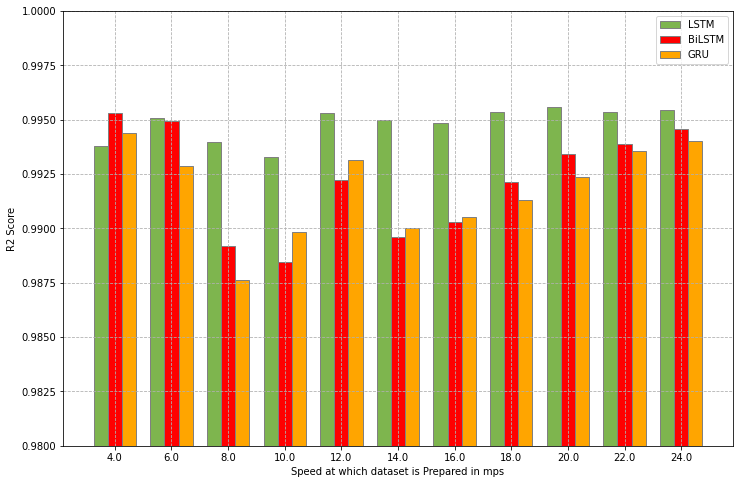

In [ ]:
barWidth = 0.25
fig = plt.subplots(figsize=(12, 8))

# Set position of bar on X axis
br1 = np.arange(11)
br2 = [x + barWidth for x in br1]
br3 = [x + barWidth for x in br2]
plt.grid('on',zorder=0, linestyle='--')

# Make the plot
plt.bar(br1, abc[:,1],color = '#7eb54e', width=barWidth, alpha = 1,
        edgecolor='grey', label='LSTM')
plt.bar(br2, abc[:,2], color = 'red',width=barWidth,alpha = 1,
        edgecolor='grey', label='BiLSTM')
plt.bar(br3, abc[:,3], color = 'orange',width=barWidth,alpha = 1,
        edgecolor='grey', label='GRU')

# Adding Xticks
plt.xlabel('Speed at which dataset is Prepared in mps')
plt.ylabel('R2 Score')
default_x_ticks = range(abc.shape[0])
plt.xticks([r + barWidth for r in range(11)],
        abc[:,0])
plt.ylim([0.98, 1])

# plt.xticks(default_x_ticks, (a1[0]))

plt.legend()
plt.show()

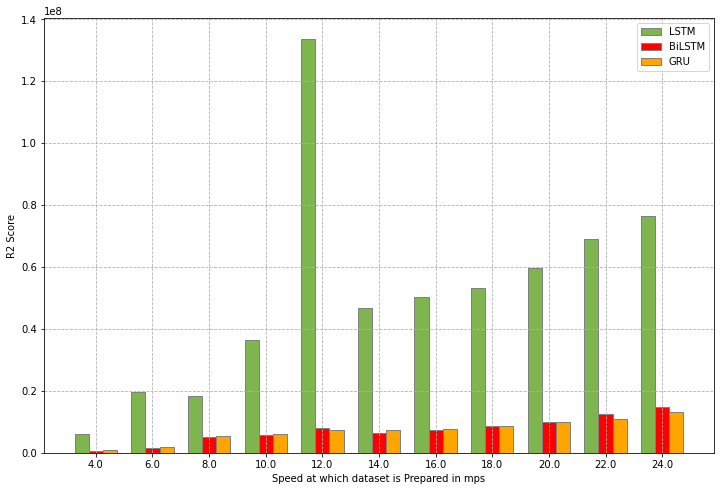

In [ ]:
barWidth = 0.25
fig = plt.subplots(figsize=(12, 8))

# Set position of bar on X axis
br1 = np.arange(11)
br2 = [x + barWidth for x in br1]
br3 = [x + barWidth for x in br2]
plt.grid('on',zorder=0, linestyle='--')

# Make the plot
plt.bar(br1, abc[:,10],color = '#7eb54e', width=barWidth, alpha = 1,
        edgecolor='grey', label='LSTM')
plt.bar(br2, abc[:,11], color = 'red',width=barWidth,alpha = 1,
        edgecolor='grey', label='BiLSTM')
plt.bar(br3, abc[:,12], color = 'orange',width=barWidth,alpha = 1,
        edgecolor='grey', label='GRU')

# Adding Xticks
plt.xlabel('Speed at which dataset is Prepared in mps')
plt.ylabel('R2 Score')
default_x_ticks = range(abc.shape[0])
plt.xticks([r + barWidth for r in range(11)],
        abc[:,0])
# plt.ylim([0.98, 1])

# plt.xticks(default_x_ticks, (a1[0]))

plt.legend()
plt.show()